In [1]:
import os
from pyiron_base import Settings

In [2]:
s = Settings()
s._configuration['sql_connection_string'] = 'sqlite:///' + os.path.join(os.path.abspath(os.path.curdir), 'pyiron.db')
s._configuration['sql_file'] = os.path.join(os.path.abspath(os.path.curdir), 'pyiron.db')
s._configuration['sql_type'] = 'SQLite'
s._configuration['sql_host'] = None
s._configuration['sql_user_key'] = None
s._configuration['sql_database'] = None
s = Settings(config=s._configuration)

In [3]:
%matplotlib inline 
import json
import numpy as np
import operator
import os
import pandas
import pylab as plt
import random
from ase.data import reference_states, atomic_numbers
import pyscal.core as pc
from pyiron.atomistics.structure.pyscal import analyse_voronoi_volume
from sklearn.neighbors.kde import KernelDensity
from pyiron.project import Project

/u/system/SLES12/soft/pyiron/dev/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.neighbors.kde module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [4]:
import matplotlib as mpl
mpl.rc('font', family='Times New Roman')
plt.rcParams["mathtext.fontset"] = "stix"

In [5]:
def analyse_cna_adaptive(atoms, mode="total"):
    """
    Use common neighbor analysis

    Args:
        atoms (pyiron.structure.atoms.Atoms): The structure to analyze.
        mode ("total"/"numeric"/"str"): Controls the style and level
        of detail of the output.
        total : return number of atoms belonging to each structure
        numeric : return a per atom list of numbers- 0 for unknown,
            1 fcc, 2 hcp, 3 bcc and 4 icosa
        str : return a per atom string of sructures

    Returns:
        (depends on `mode`)
    """
    if not mode in ["total", "numeric", "str"]:
        raise ValueError("Unsupported mode")

    sys = pc.System()
    sys.read_inputfile(atoms, format="ase")
    cna = sys.calculate_cna(cutoff=None)

    if mode == "total":
        return {n: c for n, c in zip(['CommonNeighborAnalysis.counts.OTHER', 'CommonNeighborAnalysis.counts.FCC', 'CommonNeighborAnalysis.counts.HCP', 'CommonNeighborAnalysis.counts.BCC', 'CommonNeighborAnalysis.counts.ICO'], cna)}
    else:
        atoms = sys.atoms
        cnalist = ([atom.structure for atom in atoms])
        if mode == "numeric":
            return np.array(cnalist)
        else:
            dd = ["OTHER", "FCC", "HCP", "BCC", "ICO"]
            cnalist = np.array([dd[int(x)] for x in cnalist])
            return cnalist

In [6]:
def freeze_one_half(basis):
    basis.add_tag(selective_dynamics=None)
    _, _, z = basis.scaled_pos_xyz()
    for selector, ind in zip(z < 0.5, range(len(basis))):
        if selector:
            basis.selective_dynamics[ind] = [True, True, True]
        else:
            basis.selective_dynamics[ind] = [False, False, False]
    return basis


def remove_selective_dynamics(basis):
    if 'selective_dynamics' in basis._tag_list.keys():
        for ind in range(len(basis)):
            basis.selective_dynamics[ind] = [True, True, True]
    return basis


def set_server(job, project_parameter):
    job.potential = project_parameter['potential']
    if 'queue' in project_parameter.keys():
        job.server.queue = project_parameter['queue']
    job.server.cores = project_parameter['cpu_cores']
    return job


def create_job_template(job_name, structure, project_parameter):
    pr = project_parameter['project']
    job = pr.create_job(project_parameter['job_type'], job_name)
    job.structure = structure
    return set_server(job=job, project_parameter=project_parameter)


def fix_iso(job):
    job.input.control['fix___ensemble'] = \
        job.input.control['fix___ensemble'].replace('x 0.0 0.0 1.0 y 0.0 0.0 1.0 z 0.0 0.0 1.0', 'iso 0.0 0.0 1.0')
    return job


def fix_z_dir(job):
    job.input.control['fix___ensemble'] = \
        job.input.control['fix___ensemble'].replace('x 0.0 0.0 1.0 y 0.0 0.0 1.0 z 0.0 0.0 1.0', 'z 0.0 0.0 1.0')
    return job


def half_velocity(job, temperature):
    job.input.control['velocity'] = job.input.control['velocity'].replace(str(temperature * 2), str(temperature))
    return job


def minimize_pos(structure, project_parameter, max_iter=1000):
    ham_minimize_pos = create_job_template(
        job_name='minimize_pos',
        structure=structure,
        project_parameter=project_parameter
    )
    ham_minimize_pos.calc_minimize(
        max_iter=max_iter,
        e_tol=1.0e-9,
        f_tol=1.0e-8,
        n_print=max_iter
    )
    ham_minimize_pos.run()
    ham_minimize_pos.project.wait_for_job(
        ham_minimize_pos,
        interval_in_s=100,
        max_iterations=100000
    )
    return ham_minimize_pos


def minimize_vol(structure, project_parameter, max_iter=1000):
    ham_minimize_vol = create_job_template(
        job_name='minimize_vol',
        structure=structure,
        project_parameter=project_parameter
    )
    ham_minimize_vol.calc_minimize(
        max_iter=max_iter,
        e_tol=1.0e-9,
        f_tol=1.0e-8,
        pressure=0.0,
        n_print=max_iter
    )
    ham_minimize_vol.input.control['fix___ensemble'] += ' vmax 0.001'
    ham_minimize_vol.run()
    ham_minimize_vol.project.wait_for_job(
        ham_minimize_vol,
        interval_in_s=100,
        max_iterations=100000
    )
    return ham_minimize_vol


def next_calc(structure, temperature, project_parameter, run_time_steps=10000):
    ham_temp = create_job_template(
        job_name='temp_heating_' + str(temperature).replace('.', '_'),
        structure=structure,
        project_parameter=project_parameter
    )
    ham_temp.calc_md(
        temperature=temperature,
        # temperature_damping_timescale=100.0,
        pressure=0.0,
        # pressure_damping_timescale=1000.0,
        n_print=run_time_steps,
        n_ionic_steps=run_time_steps,
        seed=project_parameter['seed'],
    )
    ham_temp = fix_iso(job=ham_temp)
    ham_temp = half_velocity(
        job=ham_temp,
        temperature=temperature
    )
    ham_temp.run()
    ham_temp.project.wait_for_job(
        ham_temp,
        interval_in_s=100,
        max_iterations=100000
    )
    return ham_temp.get_structure()


def npt_solid(temperature, basis, project_parameter, timestep=1.0):
    ham_npt_solid = create_job_template(
        job_name='ham_npt_solid_' + str(temperature).replace('.', '_'),
        structure=basis,
        project_parameter=project_parameter
    )
    ham_npt_solid.calc_md(
        temperature=temperature,
        # temperature_damping_timescale=100.0,
        time_step=timestep,
        pressure=0.0,
        # pressure_damping_timescale=1000.0,
        n_print=project_parameter['run_time_steps'],
        n_ionic_steps=project_parameter['run_time_steps'],
        seed=project_parameter['seed'],
    )
    ham_npt_solid = half_velocity(
        job=ham_npt_solid,
        temperature=temperature
    )
    ham_npt_solid = fix_iso(job=ham_npt_solid)
    ham_npt_solid.run()
    ham_npt_solid.project.wait_for_job(
        ham_npt_solid,
        interval_in_s=100,
        max_iterations=100000
    )
    return ham_npt_solid


def setup_liquid_job(job_name, basis, temperature, project_parameter, timestep=1.0):
    ham_npt_liquid_high = create_job_template(
        job_name=job_name,
        structure=freeze_one_half(basis),
        project_parameter=project_parameter
    )
    ham_npt_liquid_high.calc_md(
        temperature=temperature,
        # temperature_damping_timescale=100.0,
        time_step=timestep,
        pressure=0.0,
        # pressure_damping_timescale=1000.0,
        n_print=project_parameter['run_time_steps'],
        n_ionic_steps=project_parameter['run_time_steps'],
        seed=project_parameter['seed'],
    )
    ham_npt_liquid_high = half_velocity(
        job=ham_npt_liquid_high,
        temperature=temperature
    )
    ham_npt_liquid_high = fix_z_dir(
        job=ham_npt_liquid_high
    )
    ham_npt_liquid_high.run()
    ham_npt_liquid_high.project.wait_for_job(
        ham_npt_liquid_high,
        interval_in_s=100,
        max_iterations=100000
    )
    return ham_npt_liquid_high


def npt_liquid(temperature_solid, temperature_liquid, basis, project_parameter, timestep=1.0):
    ham_npt_liquid_high = setup_liquid_job(
        job_name='ham_npt_liquid_high_' + str(temperature_liquid).replace('.', '_'),
        basis=basis,
        temperature=temperature_liquid,
        project_parameter=project_parameter,
        timestep=timestep
    )
    ham_npt_liquid_low = setup_liquid_job(
        job_name='ham_npt_liquid_low_' + str(temperature_solid).replace('.', '_'),
        basis=ham_npt_liquid_high.get_structure(iteration_step=-1),
        temperature=temperature_solid,
        project_parameter=project_parameter,
        timestep=timestep
    )
    return ham_npt_liquid_low


def next_step_funct(number_of_atoms,
                    key_max,
                    structure_left,
                    structure_right,
                    temperature_left,
                    temperature_right,
                    distribution_initial_half,
                    structure_after_minimization,
                    run_time_steps,
                    project_parameter):
    structure_left_dict = analyse_cna_adaptive(structure_left)
    structure_right_dict = analyse_cna_adaptive(structure_right)
    temperature_diff = temperature_right - temperature_left
    if structure_left_dict[key_max] / number_of_atoms > distribution_initial_half and \
            structure_right_dict[key_max] / number_of_atoms > distribution_initial_half:
        structure_left = structure_right.copy()
        temperature_left = temperature_right
        temperature_right += temperature_diff
        structure_right = next_calc(
            structure=structure_after_minimization,
            temperature=temperature_right,
            project_parameter=project_parameter,
            run_time_steps=run_time_steps
        )
    elif structure_left_dict[key_max] / number_of_atoms > distribution_initial_half > \
            structure_right_dict[key_max] / number_of_atoms:
        temperature_diff /= 2
        temperature_left += temperature_diff
        structure_left = next_calc(
            structure=structure_after_minimization,
            temperature=temperature_left,
            project_parameter=project_parameter,
            run_time_steps=run_time_steps
        )
    elif structure_left_dict[key_max] / number_of_atoms < distribution_initial_half and \
            structure_right_dict[key_max] / number_of_atoms < distribution_initial_half:
        temperature_diff /= 2
        temperature_right = temperature_left
        temperature_left -= temperature_diff
        structure_right = structure_left.copy()
        structure_left = next_calc(
            structure=structure_after_minimization,
            temperature=temperature_left,
            project_parameter=project_parameter,
            run_time_steps=run_time_steps
        )
    else:
        raise ValueError('We should never reach this point!')
    return structure_left, structure_right, temperature_left, temperature_right


def round_temperature_next(temperature_next):
    return np.round(temperature_next, 2)


def strain_circle(basis_relative, temperature_next, nve_run_time_steps, project_parameter, timestep=1.0,
                  strain_result_lst=None, pressure_result_lst=None, center=None, fit_range=0.02):
    strain_lst, pressure_lst, temperature_lst, pressure_std_lst, temperature_std_lst = [], [], [], [], []
    ovito_dict_lst, ham_nvt_lst, ham_nve_lst = [], [], []
    strain_value_lst = get_strain_lst(
        fit_range=fit_range,
        points=project_parameter['points'],
        strain_result_lst=strain_result_lst,
        pressure_result_lst=pressure_result_lst,
        center=center
    )
    temperature_next = round_temperature_next(temperature_next)
    for strain in strain_value_lst:
        job_name = get_nve_job_name(
            temperature_next=temperature_next,
            strain=strain,
            steps_lst=project_parameter['nve_run_time_steps_lst'],
            nve_run_time_steps=nve_run_time_steps
        )
        ham_nve = project_parameter['project'].load(job_name)
        if ham_nve is None:
            basis_strain = basis_relative.copy()
            cell = basis_strain.cell.copy()
            cell[2, 2] *= strain
            basis_strain.set_cell(cell=cell, scale_atoms=True)
            ham_nvt = create_job_template(job_name=job_name.replace('nve', 'nvt'),
                                          structure=basis_strain,
                                          project_parameter=project_parameter)
            ham_nvt.calc_md(
                temperature=temperature_next,
                time_step=timestep,
                # temperature_damping_timescale=100.0,
                n_print=project_parameter['nvt_run_time_steps'],
                n_ionic_steps=project_parameter['nvt_run_time_steps'],
                seed=project_parameter['seed'],
            )
            ham_nvt.input.control['fix___ensemble'] += ' drag 1'
            ham_nvt = half_velocity(
                job=ham_nvt,
                temperature=temperature_next
            )
            ham_nvt.write_restart_file()
            ham_nvt.run()
            ham_nvt_lst.append(ham_nvt)
    for ham_nvt in ham_nvt_lst:
        ham_nvt.project.wait_for_job(
            ham_nvt,
            interval_in_s=100,
            max_iterations=100000
        )
        ham_nve = ham_nvt.restart()
        ham_nve.job_name = ham_nvt.job_name.replace('nvt', 'nve')
        ham_nve.calc_md(
            n_ionic_steps=nve_run_time_steps,
            time_step=timestep,
            n_print=nve_run_time_steps / 100,
            seed=project_parameter['seed'],
        )
        ham_nve = set_server(
            job=ham_nve,
            project_parameter=project_parameter
        )
        ham_nve.input.control['dump___1'] = \
            ham_nve.input.control['dump___1'].replace('${dumptime}', str(nve_run_time_steps))
        ham_nve.run()
        ham_nve_lst.append(ham_nve)
    for ham_nve in ham_nve_lst:
        ham_nve.project.wait_for_job(
            ham_nve,
            interval_in_s=100,
            max_iterations=100000
        )
    for strain in strain_value_lst:
        job_name = get_nve_job_name(
            temperature_next=temperature_next,
            strain=strain,
            steps_lst=project_parameter['nve_run_time_steps_lst'],
            nve_run_time_steps=nve_run_time_steps
        )
        ham_nve = project_parameter['project'].load(job_name)
        press, temperature, press_std, temperature_std, ovito_dict = [
            np.mean(get_press(ham=ham_nve, step=-20)),
            np.mean(ham_nve['output/generic/temperature'][-20:]),
            np.std(get_press(ham=ham_nve, step=-20)),
            np.std(ham_nve['output/generic/temperature'][-20:]),
            analyse_cna_adaptive(ham_nve.get_structure(iteration_step=-1))
        ]
        strain_lst.append(strain)
        pressure_lst.append(press)
        temperature_lst.append(temperature)
        pressure_std_lst.append(press_std)
        temperature_std_lst.append(temperature_std)
        ovito_dict_lst.append(ovito_dict)
    return strain_lst, pressure_lst, temperature_lst, pressure_std_lst, temperature_std_lst, ovito_dict_lst


def analyse_minimized_structure(ham):
    final_structure = ham.get_structure(
        iteration_step=-1
    )
    final_structure_dict = analyse_cna_adaptive(final_structure)
    key_max = max(final_structure_dict.items(), key=operator.itemgetter(1))[0]
    number_of_atoms = len(final_structure)
    distribution_initial = final_structure_dict[key_max] / number_of_atoms
    distribution_initial_half = distribution_initial / 2
    return final_structure, key_max, number_of_atoms, distribution_initial_half, final_structure_dict


def get_press(ham, step=20):
    return np.mean(ham['output/generic/pressures'][step:, :, :].diagonal(0, 2), axis=1)


def get_center_point(strain_result_lst=None, pressure_result_lst=None, center=None):
    if strain_result_lst is not None and len(strain_result_lst) != 0 and \
            pressure_result_lst is not None and len(pressure_result_lst) != 0:
        center_point = np.round(np.roots(np.polyfit(strain_result_lst, pressure_result_lst, 1))[0], 2)
    elif center is not None:
        center_point = center
    else:
        center_point = 1.0
    return center_point


def get_strain_lst(fit_range=0.02, points=21, strain_result_lst=None, pressure_result_lst=None, center=None):
    center_point = get_center_point(
        strain_result_lst=strain_result_lst,
        pressure_result_lst=pressure_result_lst,
        center=center
    )
    return [np.round(s, 3) for s in np.linspace(center_point-fit_range, center_point+fit_range, points)]


def get_nve_job_name(temperature_next, strain, steps_lst, nve_run_time_steps):
    temperature_next = round_temperature_next(temperature_next)
    temp_str = str(temperature_next).replace('.', '_')
    strain_str = str(strain).replace('.', '_')
    steps_str = str(steps_lst.index(nve_run_time_steps))
    return 'ham_nve_' + strain_str + '_' + temp_str + '_' + steps_str


def plot_solid_liquid_ratio(temperature_next, strain_lst, nve_run_time_steps, project_parameter, debug_plot=True):
    cna_str = project_parameter['crystalstructure'].upper()
    ratio_lst = []
    for strain in strain_lst:
        job_name = get_nve_job_name(
            temperature_next=temperature_next,
            strain=strain,
            steps_lst=project_parameter['nve_run_time_steps_lst'],
            nve_run_time_steps=nve_run_time_steps
        )
        ham_nve = project_parameter['project'].load(job_name)
        struct = ham_nve.get_structure().center_coordinates_in_unit_cell()
        cna = analyse_cna_adaptive(struct, mode='str')
        bcc_count = sum(cna == 'BCC')
        fcc_count = sum(cna == 'FCC')
        hcp_count = sum(cna == 'HCP')
        if (cna_str == 'BCC' and bcc_count > fcc_count and bcc_count > hcp_count) or \
                (cna_str == 'FCC' and fcc_count > bcc_count and fcc_count > hcp_count) or \
                (cna_str == 'HCP' and hcp_count > bcc_count and hcp_count > fcc_count):
            # plt.figure(figsize=(16,12))
            bandwidth = (struct.get_volume()/len(struct))**(1.0/3.0)
            kde = KernelDensity(kernel='gaussian',
                                bandwidth=bandwidth).fit(struct.positions[:, 2][cna == cna_str].reshape(-1, 1))
            z_range = np.linspace(struct.positions[:, 2].min(), struct.positions[:, 2].max(), 1000)
            sample = kde.score_samples(z_range.reshape(-1, 1))
            gaussian_funct = np.exp(sample)/np.exp(sample).max()
            z_range_above_limit = z_range[np.where(gaussian_funct > 0.1)]
            z_range_below_limit = z_range[np.where(gaussian_funct < 0.1)]
            if len(z_range_above_limit) != 0:
                ratio_above = (np.max(z_range_above_limit)-np.min(z_range_above_limit)) / \
                              (np.max(z_range)-np.min(z_range))
            else:
                ratio_above = 1.0
            if len(z_range_below_limit) != 0:
                ratio_below = 1 - (np.max(z_range_below_limit)-np.min(z_range_below_limit)) / \
                              (np.max(z_range)-np.min(z_range))
            else:
                ratio_below = 0.0
            if ratio_below == 0.0:
                ratio = ratio_above
            elif ratio_above == 1.0:
                ratio = ratio_below
            else:
                ratio = np.min([ratio_below, ratio_above])
            ratio_lst.append(ratio)
        else:
            z_range = None
            gaussian_funct = None
            z_range_above_limit = None
            ratio = None
            ratio_lst.append(0.0)
        if debug_plot:
            plt.title('strain: ' + str(strain))
            plt.xlabel('position z')
            plt.ylabel('position x')
            plt.plot(struct.positions[:, 2], struct.positions[:, 0], 'o', label='all')
            plt.plot(struct.positions[:, 2][cna == 'BCC'], struct.positions[:, 0][cna == 'BCC'], 'x', label='BCC')
            plt.plot(struct.positions[:, 2][cna == 'FCC'], struct.positions[:, 0][cna == 'FCC'], 'x', label='FCC')
            plt.plot(struct.positions[:, 2][cna == 'HCP'], struct.positions[:, 0][cna == 'HCP'], 'x', label='HCP')
            cna_str_lst = struct.positions[:, 2][cna == cna_str]
            if len(cna_str_lst) != 0:
                plt.axvline(cna_str_lst.max(), color='red')
                plt.axvline(cna_str_lst.min(), color='red')
            plt.legend()
            plt.show()
            plt.xlabel('Position in z')
            plt.ylabel('kernel density score')
            plt.title('strain: ' + str(strain))
            if z_range is not None:
                plt.plot(z_range, gaussian_funct, label=cna_str)
                plt.axvline(np.min(z_range_above_limit), color='black', linestyle='--', label='ratio: ' + str(ratio))
                plt.axvline(np.max(z_range_above_limit), color='black', linestyle='--')
            plt.axhline(0.1, color='red')
            plt.legend()
            plt.show()
    return ratio_lst


def ratio_selection(strain_lst, ratio_lst, pressure_lst, temperature_lst, ratio_boundary, debug_plot=True):
    if debug_plot:
        plt.plot(strain_lst, ratio_lst)
        plt.axhline(0.5 + ratio_boundary, color='red', linestyle='--')
        plt.axhline(0.5, color='black', linestyle='--')
        plt.axhline(0.5 - ratio_boundary, color='red', linestyle='--')
        plt.xlabel('Strain')
        plt.ylabel('ratio solid vs. liquid')
    rat_lst, rat_col_lst = [], []
    for rat in ratio_lst:
        if (0.5 - ratio_boundary) < rat < (0.5 + ratio_boundary):
            rat_lst.append(rat)
        elif len(rat_lst) != 0:
            rat_col_lst.append(rat_lst)
            rat_lst = []
    if len(rat_lst) != 0:
        rat_col_lst.append(rat_lst)
    if len(rat_col_lst) != 0:
        rat_max_ind = np.argmax([len(l) for l in rat_col_lst])
        ratio_ind = [r in rat_col_lst[rat_max_ind] for r in ratio_lst]
        strain_value_lst = np.array(strain_lst)[ratio_ind]
        ratio_value_lst = np.array(ratio_lst)[ratio_ind]
        pressure_value_lst = np.array(pressure_lst)[ratio_ind]
        temperature_value_lst = np.array(temperature_lst)[ratio_ind]
        if debug_plot:
            plt.axvline(np.min(strain_value_lst), color='blue', linestyle='--')
            plt.axvline(np.max(strain_value_lst), color='blue', linestyle='--')
            plt.show()
        return strain_value_lst, ratio_value_lst, pressure_value_lst, temperature_value_lst, None
    else:
        if np.mean(ratio_lst) > 0.5:
            return [], [], [], [], 1
        else:
            return [], [], [], [], -1


def plot_equilibration(temperature_next, strain_lst, nve_run_time_steps, project_parameter, debug_plot=True):
    if debug_plot:
        for strain in strain_lst:
            job_name = get_nve_job_name(
                temperature_next=temperature_next,
                strain=strain,
                steps_lst=project_parameter['nve_run_time_steps_lst'],
                nve_run_time_steps=nve_run_time_steps
            )
            ham_nve = project_parameter['project'].load(job_name)
            plt.plot(ham_nve['output/generic/temperature'], label='strain: ' + str(strain))
            plt.axhline(np.mean(ham_nve['output/generic/temperature'][-20:]), linestyle='--', color='red')
            plt.axvline(range(len(ham_nve['output/generic/temperature']))[-20], linestyle='--', color='black')
            plt.legend()
            plt.xlabel('timestep')
            plt.ylabel('Temperature K')
            plt.legend()
            plt.show()


def plot_melting_point_prediction(strain_value_lst, pressure_value_lst, temperature_value_lst, boundary_value=0.25,
                                  debug_plot=True):
    fit_press = np.poly1d(np.polyfit(strain_value_lst, pressure_value_lst, 1))
    fit_temp = np.poly1d(np.polyfit(strain_value_lst, temperature_value_lst, 1))
    fit_temp_from_press = np.poly1d(np.polyfit(pressure_value_lst, temperature_value_lst, 1))
    fit_combined = np.poly1d(np.polyfit(fit_press(strain_value_lst), fit_temp(strain_value_lst), 1))
    if debug_plot:
        plt.plot(strain_value_lst, pressure_value_lst, 'o', label='pressure (strain)')
        plt.plot(strain_value_lst, fit_press(strain_value_lst), label='fit')
        plt.xlabel('Strain')
        plt.ylabel('Pressure GPa')
        plt.legend()
        plt.show()
        plt.plot(strain_value_lst, temperature_value_lst, 'o', label='temperature (strain)')
        plt.plot(strain_value_lst, fit_temp(strain_value_lst), label='fit')
        plt.xlabel('Strain')
        plt.ylabel('Temperature K')
        plt.legend()
        plt.show()
        plt.plot(pressure_value_lst, temperature_value_lst, 'o', label='temperature (pressure)')
        plt.plot(pressure_value_lst, fit_temp_from_press(pressure_value_lst), label='fit direct')
        plt.plot(fit_press(strain_value_lst), fit_temp(strain_value_lst), label='combined fits')
        plt.xlabel('Pressure GPa')
        plt.ylabel('Temperature K')
        plt.legend()
        plt.show()
    print(fit_temp_from_press(0.0), fit_combined(0.0))
    temperature_mean = np.min(temperature_value_lst) + \
        (np.max(temperature_value_lst) - np.min(temperature_value_lst)) * 1 / 2
    temperature_left = np.min(temperature_value_lst) + \
        (np.max(temperature_value_lst) - np.min(temperature_value_lst)) * (1 / 2 - boundary_value)
    temperature_right = np.min(temperature_value_lst) + \
        (np.max(temperature_value_lst) - np.min(temperature_value_lst)) * (1 / 2 + boundary_value)
    temperature_next = fit_temp_from_press(0.0)
    return temperature_next, temperature_mean, temperature_left, temperature_right


def calc_temp_iteration(basis, temperature_next, project_parameter, timestep, nve_run_time_steps, fit_range, center,
                        debug_plot=True):
    temperature_next = round_temperature_next(temperature_next)
    ham_npt_solid = npt_solid(
        temperature=temperature_next,
        basis=basis,
        project_parameter=project_parameter,
        timestep=timestep
    )
    ham_npt_liquid_low = npt_liquid(
        temperature_solid=temperature_next,
        temperature_liquid=temperature_next + 1000,
        basis=ham_npt_solid.get_structure(),
        project_parameter=project_parameter,
        timestep=timestep
    )
    basis = ham_npt_liquid_low.get_structure()
    basis_no_selective = remove_selective_dynamics(basis)
    basis_relative = basis_no_selective.copy()
    strain_lst, pressure_lst, temperature_lst, _, _, _ = strain_circle(
        basis_relative=basis_relative,
        temperature_next=temperature_next,
        nve_run_time_steps=nve_run_time_steps,
        project_parameter=project_parameter,
        timestep=timestep,
        strain_result_lst=None,
        pressure_result_lst=None,
        center=center,
        fit_range=fit_range
    )
    ratio_lst = plot_solid_liquid_ratio(
        temperature_next=temperature_next,
        strain_lst=strain_lst,
        nve_run_time_steps=nve_run_time_steps,
        project_parameter=project_parameter,
        debug_plot=debug_plot
    )
    strain_value_lst, _, pressure_value_lst, temperature_value_lst, sl_flag = ratio_selection(
        strain_lst=strain_lst,
        ratio_lst=ratio_lst,
        pressure_lst=pressure_lst,
        temperature_lst=temperature_lst,
        ratio_boundary=project_parameter['ratio_boundary'],
        debug_plot=debug_plot
    )
    if len(strain_value_lst) > 2:
        plot_equilibration(
            temperature_next=temperature_next,
            strain_lst=strain_lst,
            nve_run_time_steps=nve_run_time_steps,
            project_parameter=project_parameter,
            debug_plot=debug_plot
        )
        ind = check_for_holes(
            temperature_next=temperature_next,
            strain_value_lst=strain_value_lst,
            nve_run_time_steps=nve_run_time_steps,
            project_parameter=project_parameter
        )
        strain_value_lst = np.array(strain_value_lst)[ind].tolist()
        pressure_value_lst = np.array(pressure_value_lst)[ind].tolist()
        temperature_value_lst = np.array(temperature_value_lst)[ind].tolist()
        temperature_next, temperature_mean, temperature_left, temperature_right = plot_melting_point_prediction(
            strain_value_lst=strain_value_lst,
            pressure_value_lst=pressure_value_lst,
            temperature_value_lst=temperature_value_lst,
            boundary_value=project_parameter['boundary_value'],
            debug_plot=True
        )
    else:
        if sl_flag < 0:
            temperature_next, temperature_mean, temperature_left, temperature_right = temperature_next * 0.95, 0.0, 0.0, 0.0
        else:
            temperature_next, temperature_mean, temperature_left, temperature_right = temperature_next * 1.05, 0.0, 0.0, 0.0
    return temperature_next, temperature_mean, temperature_left, temperature_right, strain_value_lst, pressure_value_lst


def get_initial_melting_temperature_guess(project_parameter, ham_minimize_vol, temperature_next=None):
    structure_after_minimization, key_max, number_of_atoms, distribution_initial_half, _ = analyse_minimized_structure(
        ham_minimize_vol
    )
    temperature_left = project_parameter['temperature_left']
    temperature_right = project_parameter['temperature_right']
    if temperature_next is None:
        structure_left = structure_after_minimization
        structure_right = next_calc(
            structure=structure_after_minimization,
            temperature=temperature_right,
            project_parameter=project_parameter,
            run_time_steps=project_parameter['strain_run_time_steps']
        )
        temperature_step = temperature_right - temperature_left
        while temperature_step > 10:
            structure_left, structure_right, temperature_left, temperature_right = next_step_funct(
                number_of_atoms=number_of_atoms,
                key_max=key_max,
                structure_left=structure_left,
                structure_right=structure_right,
                temperature_left=temperature_left,
                temperature_right=temperature_right,
                distribution_initial_half=distribution_initial_half,
                structure_after_minimization=structure_after_minimization,
                run_time_steps=project_parameter['strain_run_time_steps'],
                project_parameter=project_parameter)
            temperature_step = temperature_right - temperature_left
        temperature_next = int(round(temperature_left))
        return temperature_next, structure_left
    else:
        return temperature_next, ham_minimize_vol.get_structure()


def validate_convergence(pr, temperature_left, temperature_next, temperature_right, enable_iteration,
                         timestep_iter, timestep_lst, timestep, fit_range_iter, fit_range_lst, fit_range,
                         nve_run_time_steps_iter, nve_run_time_steps_lst, nve_run_time_steps,
                         strain_result_lst, pressure_result_lst, step_count, step_dict, boundary_value, ratio_boundary,
                         convergence_goal, output_file='melting.json'):
    if temperature_left < temperature_next < temperature_right and enable_iteration:
        timestep = next(timestep_iter)
        fit_range = next(fit_range_iter)
        nve_run_time_steps = next(nve_run_time_steps_iter)
    if timestep == timestep_lst[-1] and fit_range == fit_range_lst[-1] and nve_run_time_steps == nve_run_time_steps_lst[-1]:
        enable_iteration = False
    center = np.abs(get_center_point(
        strain_result_lst=strain_result_lst,
        pressure_result_lst=pressure_result_lst
    ))
    step_count += 1
    if step_count not in step_dict.keys():
        step_dict[step_count] = {'timestep': timestep,
                                 'fit_range': fit_range,
                                 'nve_run_time_steps': nve_run_time_steps,
                                 'boundary_value': boundary_value,
                                 'ratio_boundary': ratio_boundary,
                                 'temperature_next': temperature_next,
                                 'center': center}
        with open(output_file, 'w') as f:
            json.dump(step_dict, f)
    else:
        timestep = step_dict[step_count]['timestep']
        fit_range = step_dict[step_count]['fit_range']
        nve_run_time_steps = step_dict[step_count]['nve_run_time_steps']
        boundary_value = step_dict[step_count]['boundary_value']
        ratio_boundary = step_dict[step_count]['ratio_boundary']
        temperature_next = step_dict[step_count]['temperature_next']
        center = step_dict[step_count]['center']
    if np.abs(step_dict[step_count]['temperature_next'] - step_dict[step_count - 1][
            'temperature_next']) <= convergence_goal:
        convergence_goal_achieved = True
    else:
        convergence_goal_achieved = False
    return convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, \
        boundary_value, ratio_boundary, temperature_next, center


def initialise_iterators(project_parameter):
    return iter(project_parameter['timestep_lst']), iter(project_parameter['fit_range_lst']), iter(project_parameter['nve_run_time_steps_lst'])


def get_voronoi_volume(temperature_next, strain_lst, nve_run_time_steps, project_parameter):
    max_lst, mean_lst = [], []
    for strain in strain_lst:
        job_name = get_nve_job_name(
            temperature_next=temperature_next,
            strain=strain,
            steps_lst=project_parameter['nve_run_time_steps_lst'],
            nve_run_time_steps=nve_run_time_steps
        )
        ham_nve = project_parameter['project'].load(job_name)
        structure_voronoi_lst = analyse_voronoi_volume(ham_nve.get_structure())
        max_lst.append(np.max(structure_voronoi_lst))
        mean_lst.append(np.mean(structure_voronoi_lst))
    return max_lst, mean_lst


def check_for_holes(temperature_next, strain_value_lst, nve_run_time_steps, project_parameter, debug_plot=True):
    max_lst, mean_lst = get_voronoi_volume(
        temperature_next=temperature_next,
        strain_lst=strain_value_lst,
        nve_run_time_steps=nve_run_time_steps,
        project_parameter=project_parameter
    )
    if debug_plot:
        plt.plot(strain_value_lst, mean_lst, label='mean')
        plt.plot(strain_value_lst, max_lst, label='max')
        plt.axhline(np.mean(mean_lst) * 2, color='black', linestyle='--')
        plt.legend()
        plt.xlabel('Strain')
        plt.ylabel('Voronoi Volume')
        plt.show()
    return np.array(max_lst) < np.mean(mean_lst) * 2


def generate_structure(project_parameter):
    if 'lattice_constant' in project_parameter.keys():
        basis = project_parameter['project'].create_structure(
            project_parameter['element'],
            project_parameter['crystalstructure'].lower(),
            project_parameter['lattice_constant']
        )
    else:
        basis = project_parameter['project'].create_ase_bulk(
            project_parameter['element'],
            project_parameter['crystalstructure'].lower(),
            cubic=True
        )
    basis_lst = [basis.repeat([i, i, i]) for i in range(5, 30)]
    basis = basis_lst[np.argmin([np.abs(len(b) - project_parameter['number_of_atoms'] / 2)
                                 for b in basis_lst])]
    return basis


def generate_random_seed(project_parameter):
    if 'seed' not in project_parameter.keys():
        project_parameter['seed'] = random.randint(0, 99999)
    return project_parameter

In [7]:
pr = Project('melting')

In [8]:
input_file = os.path.join(pr.path, 'input.json')
output_file = os.path.join(pr.path, 'output.json')

In [9]:
pr.job_table()

,id,status,chemicalformula,job,subjob,projectpath,project,timestart,timestop,totalcputime,computer,hamilton,hamversion,parentid,masterid
0,1,finished,Al4000,minimize_pos,/minimize_pos,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:16:31.899202,2020-10-21 18:16:32.355506,0.0,janj@cmti001#1,Lammps,0.1,None,None
1,2,finished,Al4000,minimize_vol,/minimize_vol,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:16:33.135528,2020-10-21 18:16:33.587072,0.0,janj@cmti001#1,Lammps,0.1,None,None
2,3,finished,Al4000,temp_heating_1000,/temp_heating_1000,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:28:53.516347,2020-10-21 18:28:55.581259,2.0,janj@cmti001#8,Lammps,0.1,None,None
3,4,finished,Al4000,temp_heating_500_0,/temp_heating_500_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:28:57.004099,2020-10-21 18:28:59.050755,2.0,janj@cmti001#8,Lammps,0.1,None,None
4,5,finished,Al4000,temp_heating_750_0,/temp_heating_750_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:00.484433,2020-10-21 18:29:02.457136,1.0,janj@cmti001#8,Lammps,0.1,None,None
5,6,finished,Al4000,temp_heating_875_0,/temp_heating_875_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:03.976948,2020-10-21 18:29:05.942209,1.0,janj@cmti001#8,Lammps,0.1,None,None
6,7,finished,Al4000,temp_heating_812_5,/temp_heating_812_5,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:07.562699,2020-10-21 18:29:09.548516,1.0,janj@cmti001#8,Lammps,0.1,None,None
7,8,finished,Al4000,temp_heating_843_75,/temp_heating_843_75,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:11.001436,2020-10-21 18:29:12.972974,1.0,janj@cmti001#8,Lammps,0.1,None,None
8,9,finished,Al4000,temp_heating_828_125,/temp_heating_828_125,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:14.418910,2020-10-21 18:29:16.388724,1.0,janj@cmti001#8,Lammps,0.1,None,None
9,10,finished,Al4000,temp_heating_835_9375,/temp_heating_835_9375,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:17.825156,2020-10-21 18:29:19.807730,1.0,janj@cmti001#8,Lammps,0.1,None,None


In [10]:
input_dict = {
    "config": [
        "pair_style eam/fs \n", 
        "pair_coeff * * Al1.eam.fs Al\n"
    ], 
    "filename": "Al1.eam.fs", 
    "species": ["Al"], 
    "element": "Al"
}

In [11]:
pot_dict = input_dict.copy()

In [12]:
if 'model' not in pot_dict.keys():
    pot_dict['model'] = 'Lammps'
if 'name' not in pot_dict.keys():
    pot_dict['name'] = 'CustomPotential'
if 'filename' not in pot_dict.keys():
    pot_path = []
else:
    pot_path = [os.path.abspath(pot_dict['filename'])]
potential = pandas.DataFrame({'Config': [pot_dict['config']],
                             'Filename': [pot_path],
                             'Model': [pot_dict['model']],
                             'Name': [pot_dict['name']],
                             'Species': [pot_dict['species']]
                             })

In [13]:
project_parameter = {
    'project': pr,
    'run_time_steps': 50000,
    'nvt_run_time_steps': 10000,
    'nve_run_time_steps': 10000,
    'temperature_left': 0,
    'temperature_right': 1000,
    'strain_run_time_steps': 1000,
    'convergence_criterion': 1,
    'potential': potential,
    'cpu_cores': 8, 
    'job_type': pr.job_type.Lammps,
    'enable_h5md': False,
    'points': 21,
    'boundary_value': 0.25,
    'ratio_boundary': 0.25,
    'timestep_lst': [2, 2, 1],
    'fit_range_lst': [0.05, 0.01, 0.01],
    'nve_run_time_steps_lst': [25000, 20000, 50000],
    'number_of_atoms': 8000, 
}

In [14]:
for k in input_dict.keys():
    project_parameter[k] = input_dict[k]

In [15]:
if 'crystalstructure' not in project_parameter.keys():
    project_parameter['crystalstructure'] = reference_states[atomic_numbers[project_parameter['element']]]['symmetry']

In [16]:
if 'seed' not in project_parameter.keys():
    project_parameter['seed'] = random.randint(0,99999)
project_parameter['seed']

6372

In [17]:
# Values from a previous calculation can be inserted here to reproduce the results 
step_dict = {}
if os.path.exists(output_file):
    with open(output_file, 'r') as f:
        step_dict_str = json.load(f)
    for k,v in step_dict_str.items():
        step_dict[int(k)] = v
step_dict

{}

# From here on the notebook is automated - no change required !

In [18]:
step_count = 0
temperature_next = None
enable_iteration = True
convergence_goal_achieved = False

In [19]:
pr = project_parameter['project']

In [20]:
if 'lattice_constant' in project_parameter.keys():
    basis = pr.create_structure(project_parameter['element'], project_parameter['crystalstructure'].lower(), project_parameter['lattice_constant'])
elif project_parameter['crystalstructure'] == 'hcp':
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=False)
else:
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=True)
basis_lst = [basis.repeat([i, i, i]) for i in range(5,30)]
basis = basis_lst[np.argmin([np.abs(len(b)-project_parameter['number_of_atoms']/2) for b in basis_lst])]

In [21]:
analyse_cna_adaptive(basis)

{'CommonNeighborAnalysis.counts.OTHER': 0,
 'CommonNeighborAnalysis.counts.FCC': 4000,
 'CommonNeighborAnalysis.counts.HCP': 0,
 'CommonNeighborAnalysis.counts.BCC': 0,
 'CommonNeighborAnalysis.counts.ICO': 0}

In [22]:
basis.analyse_ovito_cna_adaptive()

{'CommonNeighborAnalysis.counts.BCC': 0, 'CommonNeighborAnalysis.counts.FCC': 4000, 'CommonNeighborAnalysis.counts.HCP': 0, 'CommonNeighborAnalysis.counts.ICO': 0, 'CommonNeighborAnalysis.counts.OTHER': 0}

In [23]:
basis.analyse_ovito_cna_adaptive(mode="str")

array(['FCC', 'FCC', 'FCC', ..., 'FCC', 'FCC', 'FCC'], dtype='<U3')

In [24]:
basis.analyse_ovito_cna_adaptive(mode="numeric")

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [25]:
basis.plot3d()

NGLWidget()

In [26]:
# pr.remove_jobs(recursive=True)

In [27]:
timestep_iter, fit_range_iter, nve_run_time_steps_iter = initialise_iterators(project_parameter)
timestep = next(timestep_iter)
fit_range = next(fit_range_iter)
nve_run_time_steps = next(nve_run_time_steps_iter)

In [28]:
pr.job_table()

,id,status,chemicalformula,job,subjob,projectpath,project,timestart,timestop,totalcputime,computer,hamilton,hamversion,parentid,masterid
0,1,finished,Al4000,minimize_pos,/minimize_pos,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:16:31.899202,2020-10-21 18:16:32.355506,0.0,janj@cmti001#1,Lammps,0.1,None,None
1,2,finished,Al4000,minimize_vol,/minimize_vol,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:16:33.135528,2020-10-21 18:16:33.587072,0.0,janj@cmti001#1,Lammps,0.1,None,None
2,3,finished,Al4000,temp_heating_1000,/temp_heating_1000,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:28:53.516347,2020-10-21 18:28:55.581259,2.0,janj@cmti001#8,Lammps,0.1,None,None
3,4,finished,Al4000,temp_heating_500_0,/temp_heating_500_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:28:57.004099,2020-10-21 18:28:59.050755,2.0,janj@cmti001#8,Lammps,0.1,None,None
4,5,finished,Al4000,temp_heating_750_0,/temp_heating_750_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:00.484433,2020-10-21 18:29:02.457136,1.0,janj@cmti001#8,Lammps,0.1,None,None
5,6,finished,Al4000,temp_heating_875_0,/temp_heating_875_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:03.976948,2020-10-21 18:29:05.942209,1.0,janj@cmti001#8,Lammps,0.1,None,None
6,7,finished,Al4000,temp_heating_812_5,/temp_heating_812_5,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:07.562699,2020-10-21 18:29:09.548516,1.0,janj@cmti001#8,Lammps,0.1,None,None
7,8,finished,Al4000,temp_heating_843_75,/temp_heating_843_75,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:11.001436,2020-10-21 18:29:12.972974,1.0,janj@cmti001#8,Lammps,0.1,None,None
8,9,finished,Al4000,temp_heating_828_125,/temp_heating_828_125,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:14.418910,2020-10-21 18:29:16.388724,1.0,janj@cmti001#8,Lammps,0.1,None,None
9,10,finished,Al4000,temp_heating_835_9375,/temp_heating_835_9375,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:17.825156,2020-10-21 18:29:19.807730,1.0,janj@cmti001#8,Lammps,0.1,None,None


# Step 1: set up the solid sample and roughly estimate a melting point

In [29]:
ham_minimize_pos= minimize_pos(
    structure=basis, 
    project_parameter=project_parameter
)

/u/janj/pyiron/plugins/pyiron/pyiron/lammps/interactive.py:245: UserWarning: e_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_energy_tolerance instead.
  "e_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_energy_tolerance instead."
/u/janj/pyiron/plugins/pyiron/pyiron/lammps/interactive.py:251: UserWarning: f_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_force_tolerance instead.
  "f_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_force_tolerance instead."
2020-10-21 22:33:17,092 - pyiron_log - WARNING - The job minimize_pos is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'
2020-10-21 22:33:17,092 - pyiron_log - WARNING - The job minimize_pos is being loaded instead of running. To re-run use the argument 'delete_existing_

In [30]:
ham_minimize_vol = minimize_vol(
    structure=ham_minimize_pos.get_structure(), 
    project_parameter=project_parameter
)

/u/system/SLES12/soft/pyiron/dev/anaconda3/lib/python3.7/site-packages/pyiron_base/generic/parameters.py:285: UserWarning: The input in GenericParameters changed, while the state of the job was already finished.
  "The input in GenericParameters changed, while the state of the job was already finished."
2020-10-21 22:33:17,926 - pyiron_log - WARNING - The job minimize_vol is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'
2020-10-21 22:33:17,926 - pyiron_log - WARNING - The job minimize_vol is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'


In [31]:
temperature_next, structure_left = get_initial_melting_temperature_guess(
    project_parameter=project_parameter, 
    ham_minimize_vol=ham_minimize_vol, 
    temperature_next=temperature_next
)

2020-10-21 22:33:19,053 - pyiron_log - WARNING - The job temp_heating_1000 is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'
2020-10-21 22:33:19,053 - pyiron_log - WARNING - The job temp_heating_1000 is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'
2020-10-21 22:33:20,504 - pyiron_log - WARNING - The job temp_heating_500_0 is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'
2020-10-21 22:33:20,504 - pyiron_log - WARNING - The job temp_heating_500_0 is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'
2020-10-21 22:33:21,979 - pyiron_log - WARNING - The job temp_heating_750_0 is being loaded instead of running. To re-run use the argument 'delete_existing_job=True in create_job'
2020-10-21 22:33:21,979 - pyiron_log - WARNING - The job temp_heating_750_0 is being loaded instead of

In [32]:
temperature_next   # +/- 100K 

836

In [33]:
if step_count in step_dict.keys():
    temperature_next = step_dict[step_count]['temperature_next']
else: 
    step_dict[step_count]= {'temperature_next': temperature_next}

In [34]:
step_dict

{0: {'temperature_next': 836}}

# Step 2: set up the interface structure

In [35]:
df = pr.job_table()

In [36]:
# pr.remove_job(df[df.job.str.contains("ham_")].id.values)

The job ham_npt_solid_836 was saved and received the ID: 11
The job ham_npt_liquid_high_1836 was saved and received the ID: 12
The job ham_npt_liquid_low_836 was saved and received the ID: 13


2020-10-21 22:39:51,281 - pyiron_log - WARNING - Job 'ham_nve_0_95_836_0' does not exist and cannot be loaded
2020-10-21 22:39:51,281 - pyiron_log - WARNING - Job 'ham_nve_0_95_836_0' does not exist and cannot be loaded


The job ham_nvt_0_95_836_0 was saved and received the ID: 14


2020-10-21 22:40:18,373 - pyiron_log - WARNING - Job 'ham_nve_0_955_836_0' does not exist and cannot be loaded
2020-10-21 22:40:18,373 - pyiron_log - WARNING - Job 'ham_nve_0_955_836_0' does not exist and cannot be loaded


The job ham_nvt_0_955_836_0 was saved and received the ID: 15


2020-10-21 22:40:44,716 - pyiron_log - WARNING - Job 'ham_nve_0_96_836_0' does not exist and cannot be loaded
2020-10-21 22:40:44,716 - pyiron_log - WARNING - Job 'ham_nve_0_96_836_0' does not exist and cannot be loaded


The job ham_nvt_0_96_836_0 was saved and received the ID: 16


2020-10-21 22:41:11,744 - pyiron_log - WARNING - Job 'ham_nve_0_965_836_0' does not exist and cannot be loaded
2020-10-21 22:41:11,744 - pyiron_log - WARNING - Job 'ham_nve_0_965_836_0' does not exist and cannot be loaded


The job ham_nvt_0_965_836_0 was saved and received the ID: 17


2020-10-21 22:41:39,852 - pyiron_log - WARNING - Job 'ham_nve_0_97_836_0' does not exist and cannot be loaded
2020-10-21 22:41:39,852 - pyiron_log - WARNING - Job 'ham_nve_0_97_836_0' does not exist and cannot be loaded


The job ham_nvt_0_97_836_0 was saved and received the ID: 18


2020-10-21 22:42:07,985 - pyiron_log - WARNING - Job 'ham_nve_0_975_836_0' does not exist and cannot be loaded
2020-10-21 22:42:07,985 - pyiron_log - WARNING - Job 'ham_nve_0_975_836_0' does not exist and cannot be loaded


The job ham_nvt_0_975_836_0 was saved and received the ID: 19


2020-10-21 22:42:35,676 - pyiron_log - WARNING - Job 'ham_nve_0_98_836_0' does not exist and cannot be loaded
2020-10-21 22:42:35,676 - pyiron_log - WARNING - Job 'ham_nve_0_98_836_0' does not exist and cannot be loaded


The job ham_nvt_0_98_836_0 was saved and received the ID: 20


2020-10-21 22:43:03,384 - pyiron_log - WARNING - Job 'ham_nve_0_985_836_0' does not exist and cannot be loaded
2020-10-21 22:43:03,384 - pyiron_log - WARNING - Job 'ham_nve_0_985_836_0' does not exist and cannot be loaded


The job ham_nvt_0_985_836_0 was saved and received the ID: 21


2020-10-21 22:43:30,654 - pyiron_log - WARNING - Job 'ham_nve_0_99_836_0' does not exist and cannot be loaded
2020-10-21 22:43:30,654 - pyiron_log - WARNING - Job 'ham_nve_0_99_836_0' does not exist and cannot be loaded


The job ham_nvt_0_99_836_0 was saved and received the ID: 22


2020-10-21 22:43:57,894 - pyiron_log - WARNING - Job 'ham_nve_0_995_836_0' does not exist and cannot be loaded
2020-10-21 22:43:57,894 - pyiron_log - WARNING - Job 'ham_nve_0_995_836_0' does not exist and cannot be loaded


The job ham_nvt_0_995_836_0 was saved and received the ID: 23


2020-10-21 22:44:25,222 - pyiron_log - WARNING - Job 'ham_nve_1_0_836_0' does not exist and cannot be loaded
2020-10-21 22:44:25,222 - pyiron_log - WARNING - Job 'ham_nve_1_0_836_0' does not exist and cannot be loaded


The job ham_nvt_1_0_836_0 was saved and received the ID: 24


2020-10-21 22:44:52,342 - pyiron_log - WARNING - Job 'ham_nve_1_005_836_0' does not exist and cannot be loaded
2020-10-21 22:44:52,342 - pyiron_log - WARNING - Job 'ham_nve_1_005_836_0' does not exist and cannot be loaded


The job ham_nvt_1_005_836_0 was saved and received the ID: 25


2020-10-21 22:45:19,547 - pyiron_log - WARNING - Job 'ham_nve_1_01_836_0' does not exist and cannot be loaded
2020-10-21 22:45:19,547 - pyiron_log - WARNING - Job 'ham_nve_1_01_836_0' does not exist and cannot be loaded


The job ham_nvt_1_01_836_0 was saved and received the ID: 26


2020-10-21 22:45:46,589 - pyiron_log - WARNING - Job 'ham_nve_1_015_836_0' does not exist and cannot be loaded
2020-10-21 22:45:46,589 - pyiron_log - WARNING - Job 'ham_nve_1_015_836_0' does not exist and cannot be loaded


The job ham_nvt_1_015_836_0 was saved and received the ID: 27


2020-10-21 22:46:13,279 - pyiron_log - WARNING - Job 'ham_nve_1_02_836_0' does not exist and cannot be loaded
2020-10-21 22:46:13,279 - pyiron_log - WARNING - Job 'ham_nve_1_02_836_0' does not exist and cannot be loaded


The job ham_nvt_1_02_836_0 was saved and received the ID: 28


2020-10-21 22:46:39,849 - pyiron_log - WARNING - Job 'ham_nve_1_025_836_0' does not exist and cannot be loaded
2020-10-21 22:46:39,849 - pyiron_log - WARNING - Job 'ham_nve_1_025_836_0' does not exist and cannot be loaded


The job ham_nvt_1_025_836_0 was saved and received the ID: 29


2020-10-21 22:47:06,613 - pyiron_log - WARNING - Job 'ham_nve_1_03_836_0' does not exist and cannot be loaded
2020-10-21 22:47:06,613 - pyiron_log - WARNING - Job 'ham_nve_1_03_836_0' does not exist and cannot be loaded


The job ham_nvt_1_03_836_0 was saved and received the ID: 30


2020-10-21 22:47:33,734 - pyiron_log - WARNING - Job 'ham_nve_1_035_836_0' does not exist and cannot be loaded
2020-10-21 22:47:33,734 - pyiron_log - WARNING - Job 'ham_nve_1_035_836_0' does not exist and cannot be loaded


The job ham_nvt_1_035_836_0 was saved and received the ID: 31


2020-10-21 22:48:01,100 - pyiron_log - WARNING - Job 'ham_nve_1_04_836_0' does not exist and cannot be loaded
2020-10-21 22:48:01,100 - pyiron_log - WARNING - Job 'ham_nve_1_04_836_0' does not exist and cannot be loaded


The job ham_nvt_1_04_836_0 was saved and received the ID: 32


2020-10-21 22:48:29,020 - pyiron_log - WARNING - Job 'ham_nve_1_045_836_0' does not exist and cannot be loaded
2020-10-21 22:48:29,020 - pyiron_log - WARNING - Job 'ham_nve_1_045_836_0' does not exist and cannot be loaded


The job ham_nvt_1_045_836_0 was saved and received the ID: 33


2020-10-21 22:48:57,059 - pyiron_log - WARNING - Job 'ham_nve_1_05_836_0' does not exist and cannot be loaded
2020-10-21 22:48:57,059 - pyiron_log - WARNING - Job 'ham_nve_1_05_836_0' does not exist and cannot be loaded


The job ham_nvt_1_05_836_0 was saved and received the ID: 34
The job ham_nve_0_95_836_0 was saved and received the ID: 35
The job ham_nve_0_955_836_0 was saved and received the ID: 36
The job ham_nve_0_96_836_0 was saved and received the ID: 37
The job ham_nve_0_965_836_0 was saved and received the ID: 38
The job ham_nve_0_97_836_0 was saved and received the ID: 39
The job ham_nve_0_975_836_0 was saved and received the ID: 40
The job ham_nve_0_98_836_0 was saved and received the ID: 41
The job ham_nve_0_985_836_0 was saved and received the ID: 42
The job ham_nve_0_99_836_0 was saved and received the ID: 43
The job ham_nve_0_995_836_0 was saved and received the ID: 44
The job ham_nve_1_0_836_0 was saved and received the ID: 45
The job ham_nve_1_005_836_0 was saved and received the ID: 46
The job ham_nve_1_01_836_0 was saved and received the ID: 47
The job ham_nve_1_015_836_0 was saved and received the ID: 48
The job ham_nve_1_02_836_0 was saved and received the ID: 49
The job ham_nve_1_

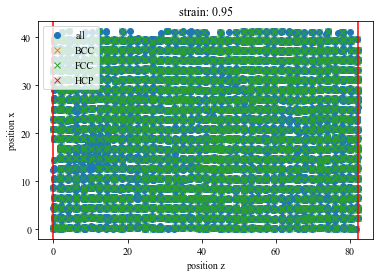

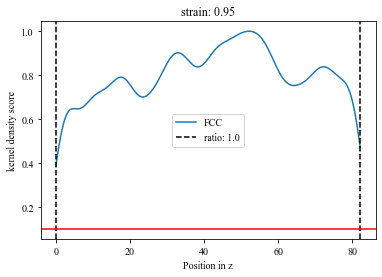

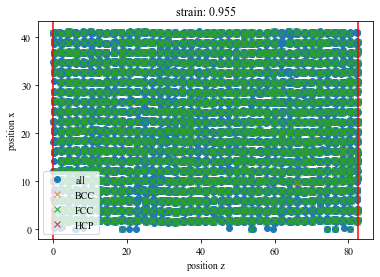

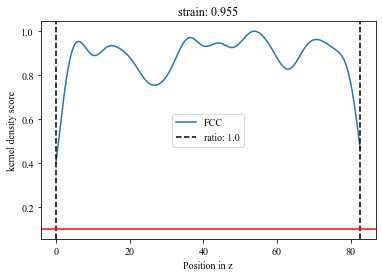

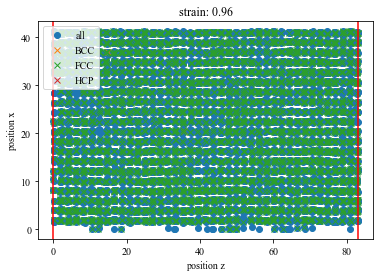

...

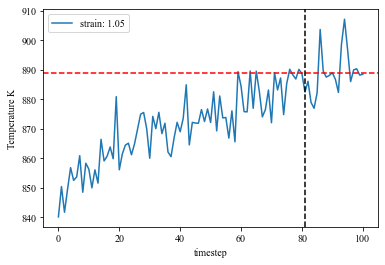

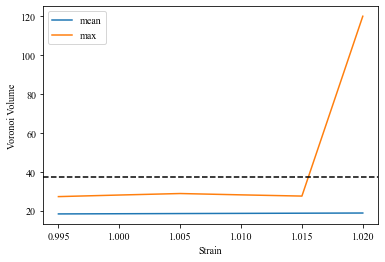

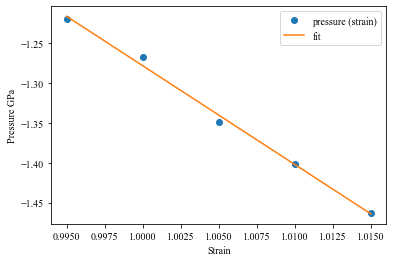

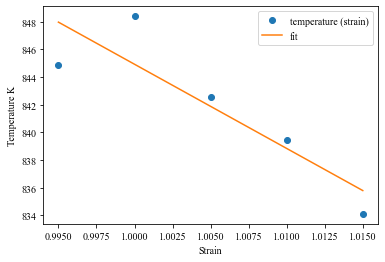

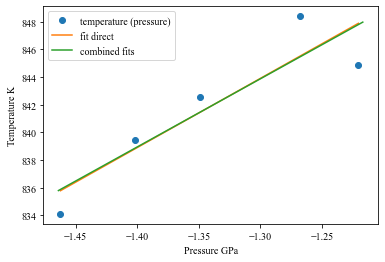

908.908942174603 907.8951491031945


In [37]:
temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep = timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=None,
        debug_plot=True)

In [38]:
temperature_next, temperature_mean, temperature_left, temperature_right

(908.908942174603, 841.2537177147123, 837.6802385675633, 844.8271968618612)

# Step 3: run NVT and NVE MD

In [39]:
output = validate_convergence(
    pr=pr,
    temperature_left=temperature_left,
    temperature_next=temperature_next,
    temperature_right=temperature_right,
    enable_iteration=enable_iteration,
    timestep_iter=timestep_iter,
    timestep_lst=project_parameter['timestep_lst'],
    timestep=timestep,
    fit_range_iter=fit_range_iter,
    fit_range_lst=project_parameter['fit_range_lst'],
    fit_range=fit_range,
    nve_run_time_steps_iter=nve_run_time_steps_iter,
    nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'],
    nve_run_time_steps=nve_run_time_steps,
    strain_result_lst=strain_result_lst,
    pressure_result_lst=pressure_result_lst,
    step_count=step_count,
    step_dict=step_dict,
    boundary_value=project_parameter['boundary_value'],
    ratio_boundary=project_parameter['ratio_boundary'],
    convergence_goal=project_parameter['convergence_criterion'],
    output_file=output_file
)
convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output

In [40]:
step_dict[step_count]

{'timestep': 2,
 'fit_range': 0.05,
 'nve_run_time_steps': 25000,
 'boundary_value': 0.25,
 'ratio_boundary': 0.25,
 'temperature_next': 908.908942174603,
 'center': 0.9}

In [41]:
convergence_goal_achieved

False

# Step 4: full cycle, predict the final melting point

The job ham_npt_solid_908_91 was saved and received the ID: 56
The job ham_npt_liquid_high_1908_9099999999999 was saved and received the ID: 57
The job ham_npt_liquid_low_908_91 was saved and received the ID: 58


2020-10-21 23:20:34,807 - pyiron_log - WARNING - Job 'ham_nve_0_85_908_91_0' does not exist and cannot be loaded
2020-10-21 23:20:34,807 - pyiron_log - WARNING - Job 'ham_nve_0_85_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_85_908_91_0 was saved and received the ID: 59


2020-10-21 23:21:04,376 - pyiron_log - WARNING - Job 'ham_nve_0_855_908_91_0' does not exist and cannot be loaded
2020-10-21 23:21:04,376 - pyiron_log - WARNING - Job 'ham_nve_0_855_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_855_908_91_0 was saved and received the ID: 60


2020-10-21 23:21:33,724 - pyiron_log - WARNING - Job 'ham_nve_0_86_908_91_0' does not exist and cannot be loaded
2020-10-21 23:21:33,724 - pyiron_log - WARNING - Job 'ham_nve_0_86_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_86_908_91_0 was saved and received the ID: 61


2020-10-21 23:22:03,045 - pyiron_log - WARNING - Job 'ham_nve_0_865_908_91_0' does not exist and cannot be loaded
2020-10-21 23:22:03,045 - pyiron_log - WARNING - Job 'ham_nve_0_865_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_865_908_91_0 was saved and received the ID: 62


2020-10-21 23:22:31,876 - pyiron_log - WARNING - Job 'ham_nve_0_87_908_91_0' does not exist and cannot be loaded
2020-10-21 23:22:31,876 - pyiron_log - WARNING - Job 'ham_nve_0_87_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_87_908_91_0 was saved and received the ID: 63


2020-10-21 23:23:00,725 - pyiron_log - WARNING - Job 'ham_nve_0_875_908_91_0' does not exist and cannot be loaded
2020-10-21 23:23:00,725 - pyiron_log - WARNING - Job 'ham_nve_0_875_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_875_908_91_0 was saved and received the ID: 64


2020-10-21 23:23:29,773 - pyiron_log - WARNING - Job 'ham_nve_0_88_908_91_0' does not exist and cannot be loaded
2020-10-21 23:23:29,773 - pyiron_log - WARNING - Job 'ham_nve_0_88_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_88_908_91_0 was saved and received the ID: 65


2020-10-21 23:23:59,145 - pyiron_log - WARNING - Job 'ham_nve_0_885_908_91_0' does not exist and cannot be loaded
2020-10-21 23:23:59,145 - pyiron_log - WARNING - Job 'ham_nve_0_885_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_885_908_91_0 was saved and received the ID: 66


2020-10-21 23:24:27,880 - pyiron_log - WARNING - Job 'ham_nve_0_89_908_91_0' does not exist and cannot be loaded
2020-10-21 23:24:27,880 - pyiron_log - WARNING - Job 'ham_nve_0_89_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_89_908_91_0 was saved and received the ID: 67


2020-10-21 23:24:56,261 - pyiron_log - WARNING - Job 'ham_nve_0_895_908_91_0' does not exist and cannot be loaded
2020-10-21 23:24:56,261 - pyiron_log - WARNING - Job 'ham_nve_0_895_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_895_908_91_0 was saved and received the ID: 68


2020-10-21 23:25:24,901 - pyiron_log - WARNING - Job 'ham_nve_0_9_908_91_0' does not exist and cannot be loaded
2020-10-21 23:25:24,901 - pyiron_log - WARNING - Job 'ham_nve_0_9_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_9_908_91_0 was saved and received the ID: 69


2020-10-21 23:25:53,336 - pyiron_log - WARNING - Job 'ham_nve_0_905_908_91_0' does not exist and cannot be loaded
2020-10-21 23:25:53,336 - pyiron_log - WARNING - Job 'ham_nve_0_905_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_905_908_91_0 was saved and received the ID: 70


2020-10-21 23:26:21,969 - pyiron_log - WARNING - Job 'ham_nve_0_91_908_91_0' does not exist and cannot be loaded
2020-10-21 23:26:21,969 - pyiron_log - WARNING - Job 'ham_nve_0_91_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_91_908_91_0 was saved and received the ID: 71


2020-10-21 23:26:50,477 - pyiron_log - WARNING - Job 'ham_nve_0_915_908_91_0' does not exist and cannot be loaded
2020-10-21 23:26:50,477 - pyiron_log - WARNING - Job 'ham_nve_0_915_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_915_908_91_0 was saved and received the ID: 72


2020-10-21 23:27:18,900 - pyiron_log - WARNING - Job 'ham_nve_0_92_908_91_0' does not exist and cannot be loaded
2020-10-21 23:27:18,900 - pyiron_log - WARNING - Job 'ham_nve_0_92_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_92_908_91_0 was saved and received the ID: 73


2020-10-21 23:27:47,259 - pyiron_log - WARNING - Job 'ham_nve_0_925_908_91_0' does not exist and cannot be loaded
2020-10-21 23:27:47,259 - pyiron_log - WARNING - Job 'ham_nve_0_925_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_925_908_91_0 was saved and received the ID: 74


2020-10-21 23:28:15,396 - pyiron_log - WARNING - Job 'ham_nve_0_93_908_91_0' does not exist and cannot be loaded
2020-10-21 23:28:15,396 - pyiron_log - WARNING - Job 'ham_nve_0_93_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_93_908_91_0 was saved and received the ID: 75


2020-10-21 23:28:43,491 - pyiron_log - WARNING - Job 'ham_nve_0_935_908_91_0' does not exist and cannot be loaded
2020-10-21 23:28:43,491 - pyiron_log - WARNING - Job 'ham_nve_0_935_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_935_908_91_0 was saved and received the ID: 76


2020-10-21 23:29:11,704 - pyiron_log - WARNING - Job 'ham_nve_0_94_908_91_0' does not exist and cannot be loaded
2020-10-21 23:29:11,704 - pyiron_log - WARNING - Job 'ham_nve_0_94_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_94_908_91_0 was saved and received the ID: 77


2020-10-21 23:29:40,117 - pyiron_log - WARNING - Job 'ham_nve_0_945_908_91_0' does not exist and cannot be loaded
2020-10-21 23:29:40,117 - pyiron_log - WARNING - Job 'ham_nve_0_945_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_945_908_91_0 was saved and received the ID: 78


2020-10-21 23:30:08,444 - pyiron_log - WARNING - Job 'ham_nve_0_95_908_91_0' does not exist and cannot be loaded
2020-10-21 23:30:08,444 - pyiron_log - WARNING - Job 'ham_nve_0_95_908_91_0' does not exist and cannot be loaded


The job ham_nvt_0_95_908_91_0 was saved and received the ID: 79
The job ham_nve_0_85_908_91_0 was saved and received the ID: 80
The job ham_nve_0_855_908_91_0 was saved and received the ID: 81
The job ham_nve_0_86_908_91_0 was saved and received the ID: 82
The job ham_nve_0_865_908_91_0 was saved and received the ID: 83
The job ham_nve_0_87_908_91_0 was saved and received the ID: 84
The job ham_nve_0_875_908_91_0 was saved and received the ID: 85
The job ham_nve_0_88_908_91_0 was saved and received the ID: 86
The job ham_nve_0_885_908_91_0 was saved and received the ID: 87
The job ham_nve_0_89_908_91_0 was saved and received the ID: 88
The job ham_nve_0_895_908_91_0 was saved and received the ID: 89
The job ham_nve_0_9_908_91_0 was saved and received the ID: 90
The job ham_nve_0_905_908_91_0 was saved and received the ID: 91
The job ham_nve_0_91_908_91_0 was saved and received the ID: 92
The job ham_nve_0_915_908_91_0 was saved and received the ID: 93
The job ham_nve_0_92_908_91_0 was 

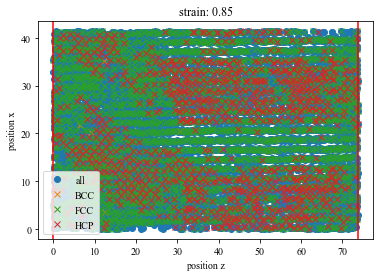

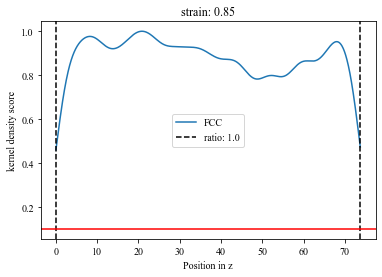

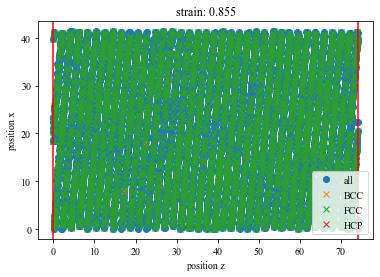

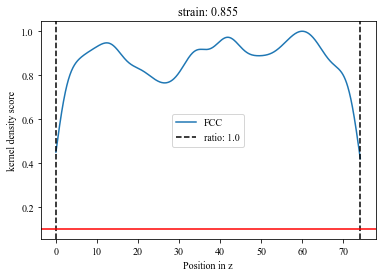

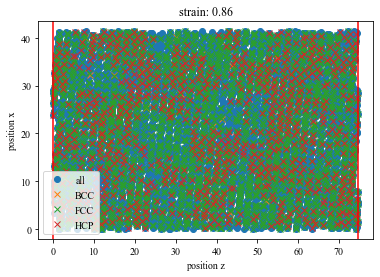

...

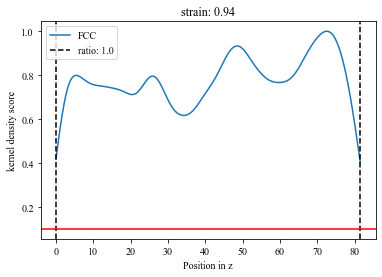

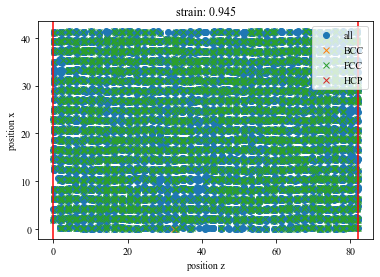

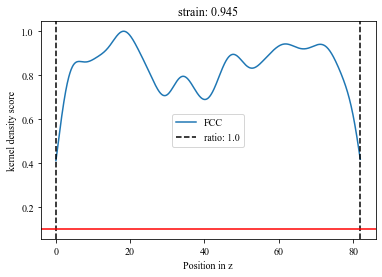

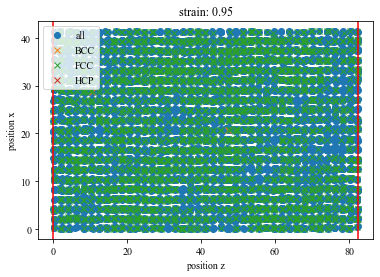

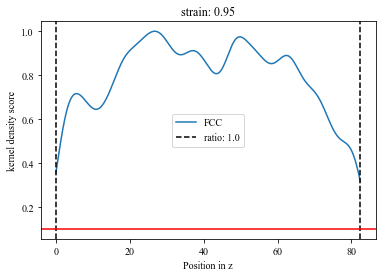

954.3555 0.0 0.0 0.0
{'timestep': 2, 'fit_range': 0.05, 'nve_run_time_steps': 25000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 954.3555, 'center': 1.0}
The job ham_npt_solid_954_36 was saved and received the ID: 101
The job ham_npt_liquid_high_1954_3600000000001 was saved and received the ID: 102
The job ham_npt_liquid_low_954_36 was saved and received the ID: 103


2020-10-22 00:02:18,691 - pyiron_log - WARNING - Job 'ham_nve_0_95_954_36_0' does not exist and cannot be loaded
2020-10-22 00:02:18,691 - pyiron_log - WARNING - Job 'ham_nve_0_95_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_95_954_36_0 was saved and received the ID: 104


2020-10-22 00:02:47,077 - pyiron_log - WARNING - Job 'ham_nve_0_955_954_36_0' does not exist and cannot be loaded
2020-10-22 00:02:47,077 - pyiron_log - WARNING - Job 'ham_nve_0_955_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_955_954_36_0 was saved and received the ID: 105


2020-10-22 00:03:14,949 - pyiron_log - WARNING - Job 'ham_nve_0_96_954_36_0' does not exist and cannot be loaded
2020-10-22 00:03:14,949 - pyiron_log - WARNING - Job 'ham_nve_0_96_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_96_954_36_0 was saved and received the ID: 106


2020-10-22 00:03:42,926 - pyiron_log - WARNING - Job 'ham_nve_0_965_954_36_0' does not exist and cannot be loaded
2020-10-22 00:03:42,926 - pyiron_log - WARNING - Job 'ham_nve_0_965_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_965_954_36_0 was saved and received the ID: 107


2020-10-22 00:04:10,541 - pyiron_log - WARNING - Job 'ham_nve_0_97_954_36_0' does not exist and cannot be loaded
2020-10-22 00:04:10,541 - pyiron_log - WARNING - Job 'ham_nve_0_97_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_97_954_36_0 was saved and received the ID: 108


2020-10-22 00:04:38,274 - pyiron_log - WARNING - Job 'ham_nve_0_975_954_36_0' does not exist and cannot be loaded
2020-10-22 00:04:38,274 - pyiron_log - WARNING - Job 'ham_nve_0_975_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_975_954_36_0 was saved and received the ID: 109


2020-10-22 00:05:05,535 - pyiron_log - WARNING - Job 'ham_nve_0_98_954_36_0' does not exist and cannot be loaded
2020-10-22 00:05:05,535 - pyiron_log - WARNING - Job 'ham_nve_0_98_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_98_954_36_0 was saved and received the ID: 110


2020-10-22 00:05:32,808 - pyiron_log - WARNING - Job 'ham_nve_0_985_954_36_0' does not exist and cannot be loaded
2020-10-22 00:05:32,808 - pyiron_log - WARNING - Job 'ham_nve_0_985_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_985_954_36_0 was saved and received the ID: 111


2020-10-22 00:05:59,687 - pyiron_log - WARNING - Job 'ham_nve_0_99_954_36_0' does not exist and cannot be loaded
2020-10-22 00:05:59,687 - pyiron_log - WARNING - Job 'ham_nve_0_99_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_99_954_36_0 was saved and received the ID: 112


2020-10-22 00:06:26,277 - pyiron_log - WARNING - Job 'ham_nve_0_995_954_36_0' does not exist and cannot be loaded
2020-10-22 00:06:26,277 - pyiron_log - WARNING - Job 'ham_nve_0_995_954_36_0' does not exist and cannot be loaded


The job ham_nvt_0_995_954_36_0 was saved and received the ID: 113


2020-10-22 00:06:53,096 - pyiron_log - WARNING - Job 'ham_nve_1_0_954_36_0' does not exist and cannot be loaded
2020-10-22 00:06:53,096 - pyiron_log - WARNING - Job 'ham_nve_1_0_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_0_954_36_0 was saved and received the ID: 114


2020-10-22 00:07:19,513 - pyiron_log - WARNING - Job 'ham_nve_1_005_954_36_0' does not exist and cannot be loaded
2020-10-22 00:07:19,513 - pyiron_log - WARNING - Job 'ham_nve_1_005_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_005_954_36_0 was saved and received the ID: 115


2020-10-22 00:07:45,744 - pyiron_log - WARNING - Job 'ham_nve_1_01_954_36_0' does not exist and cannot be loaded
2020-10-22 00:07:45,744 - pyiron_log - WARNING - Job 'ham_nve_1_01_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_01_954_36_0 was saved and received the ID: 116


2020-10-22 00:08:12,022 - pyiron_log - WARNING - Job 'ham_nve_1_015_954_36_0' does not exist and cannot be loaded
2020-10-22 00:08:12,022 - pyiron_log - WARNING - Job 'ham_nve_1_015_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_015_954_36_0 was saved and received the ID: 117


2020-10-22 00:08:37,835 - pyiron_log - WARNING - Job 'ham_nve_1_02_954_36_0' does not exist and cannot be loaded
2020-10-22 00:08:37,835 - pyiron_log - WARNING - Job 'ham_nve_1_02_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_02_954_36_0 was saved and received the ID: 118


2020-10-22 00:09:03,904 - pyiron_log - WARNING - Job 'ham_nve_1_025_954_36_0' does not exist and cannot be loaded
2020-10-22 00:09:03,904 - pyiron_log - WARNING - Job 'ham_nve_1_025_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_025_954_36_0 was saved and received the ID: 119


2020-10-22 00:09:30,520 - pyiron_log - WARNING - Job 'ham_nve_1_03_954_36_0' does not exist and cannot be loaded
2020-10-22 00:09:30,520 - pyiron_log - WARNING - Job 'ham_nve_1_03_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_03_954_36_0 was saved and received the ID: 120


2020-10-22 00:09:57,662 - pyiron_log - WARNING - Job 'ham_nve_1_035_954_36_0' does not exist and cannot be loaded
2020-10-22 00:09:57,662 - pyiron_log - WARNING - Job 'ham_nve_1_035_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_035_954_36_0 was saved and received the ID: 121


2020-10-22 00:10:24,883 - pyiron_log - WARNING - Job 'ham_nve_1_04_954_36_0' does not exist and cannot be loaded
2020-10-22 00:10:24,883 - pyiron_log - WARNING - Job 'ham_nve_1_04_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_04_954_36_0 was saved and received the ID: 122


2020-10-22 00:10:51,960 - pyiron_log - WARNING - Job 'ham_nve_1_045_954_36_0' does not exist and cannot be loaded
2020-10-22 00:10:51,960 - pyiron_log - WARNING - Job 'ham_nve_1_045_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_045_954_36_0 was saved and received the ID: 123


2020-10-22 00:11:19,242 - pyiron_log - WARNING - Job 'ham_nve_1_05_954_36_0' does not exist and cannot be loaded
2020-10-22 00:11:19,242 - pyiron_log - WARNING - Job 'ham_nve_1_05_954_36_0' does not exist and cannot be loaded


The job ham_nvt_1_05_954_36_0 was saved and received the ID: 124
The job ham_nve_0_95_954_36_0 was saved and received the ID: 125
The job ham_nve_0_955_954_36_0 was saved and received the ID: 126
The job ham_nve_0_96_954_36_0 was saved and received the ID: 127
The job ham_nve_0_965_954_36_0 was saved and received the ID: 128
The job ham_nve_0_97_954_36_0 was saved and received the ID: 129
The job ham_nve_0_975_954_36_0 was saved and received the ID: 130
The job ham_nve_0_98_954_36_0 was saved and received the ID: 131
The job ham_nve_0_985_954_36_0 was saved and received the ID: 132
The job ham_nve_0_99_954_36_0 was saved and received the ID: 133
The job ham_nve_0_995_954_36_0 was saved and received the ID: 134
The job ham_nve_1_0_954_36_0 was saved and received the ID: 135
The job ham_nve_1_005_954_36_0 was saved and received the ID: 136
The job ham_nve_1_01_954_36_0 was saved and received the ID: 137
The job ham_nve_1_015_954_36_0 was saved and received the ID: 138
The job ham_nve_1_0

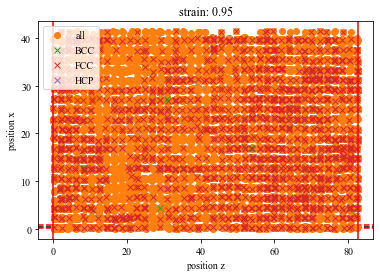

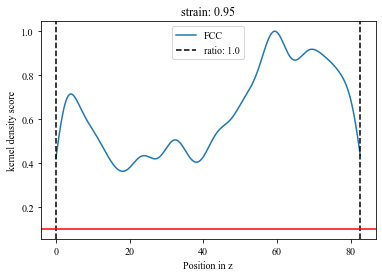

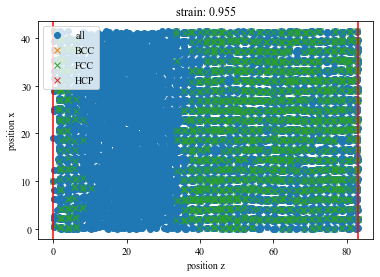

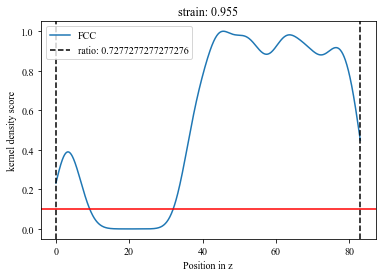

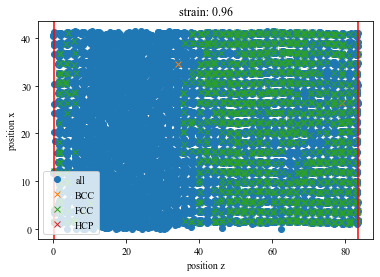

...

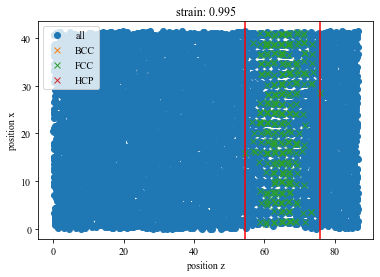

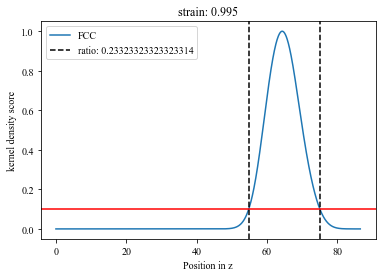

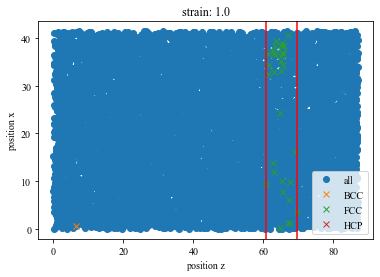

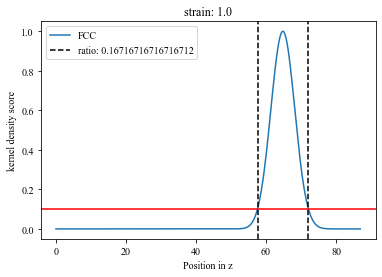

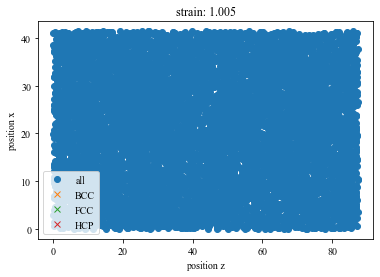

No handles with labels found to put in legend.


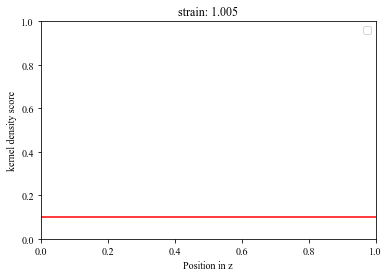

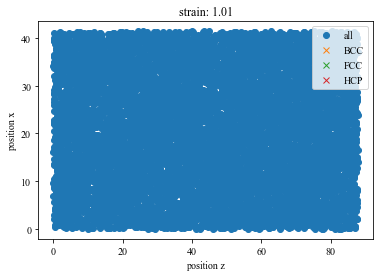

No handles with labels found to put in legend.


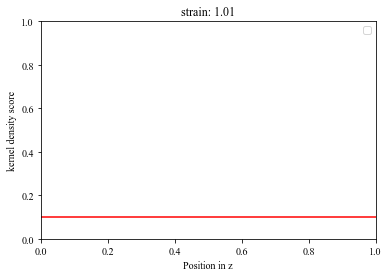

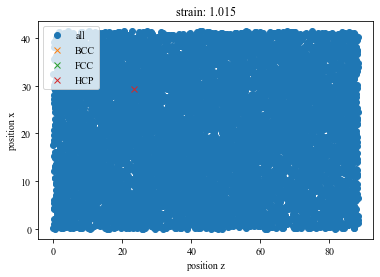

No handles with labels found to put in legend.


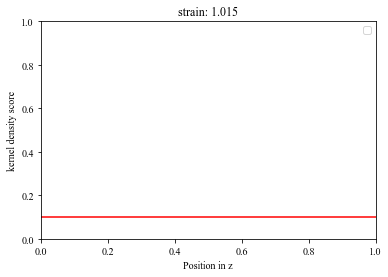

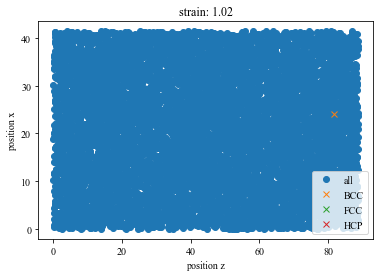

No handles with labels found to put in legend.


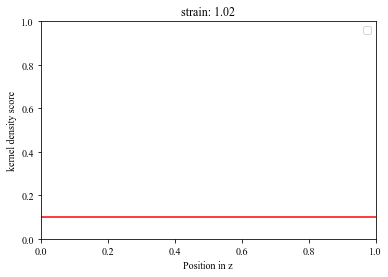

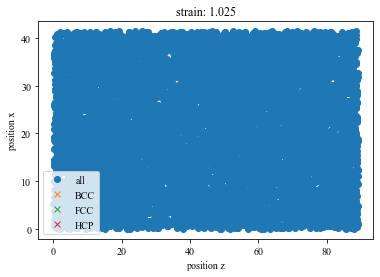

No handles with labels found to put in legend.


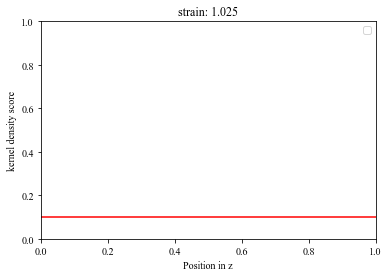

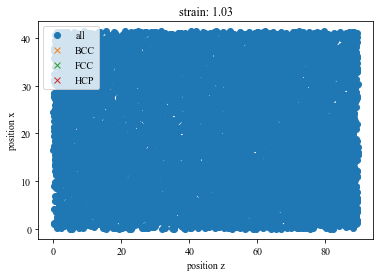

No handles with labels found to put in legend.


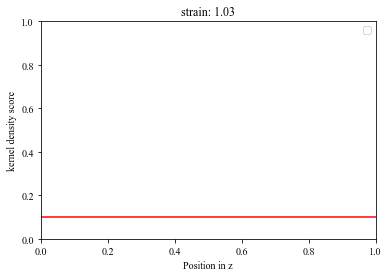

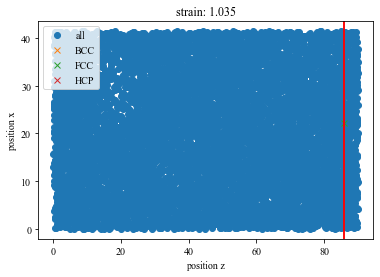

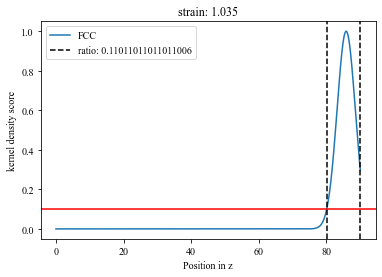

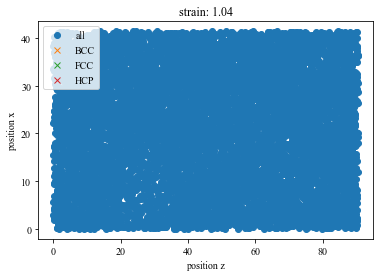

No handles with labels found to put in legend.


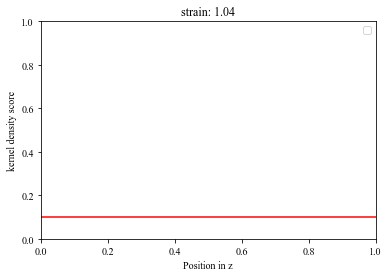

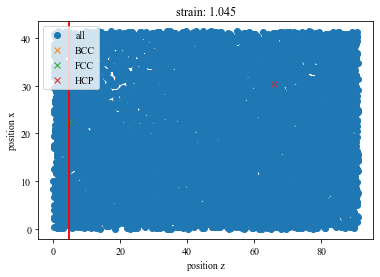

No handles with labels found to put in legend.


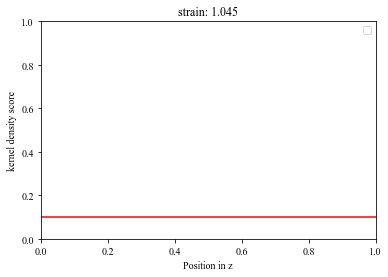

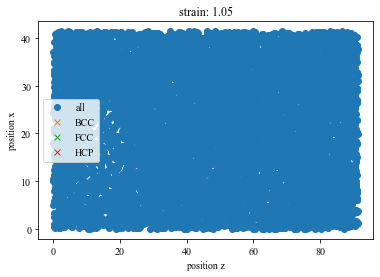

No handles with labels found to put in legend.


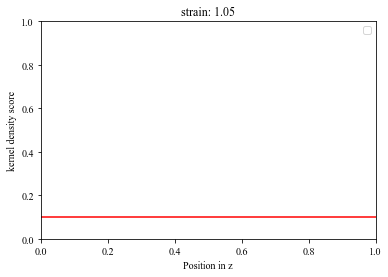

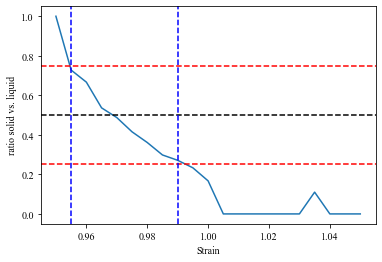

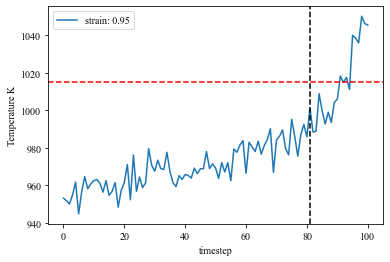

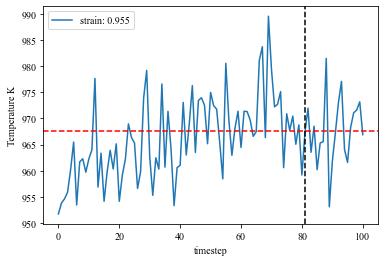

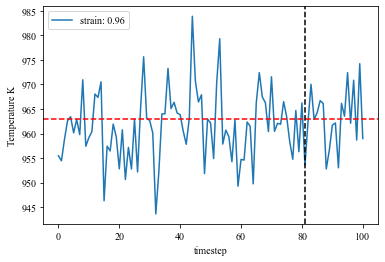

...

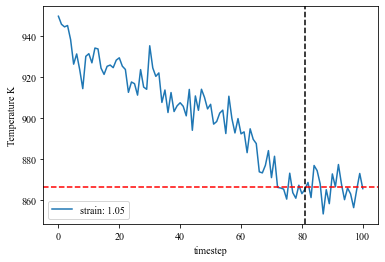

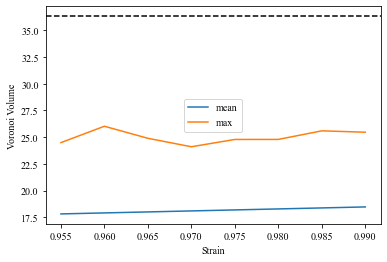

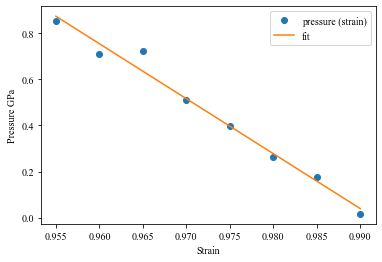

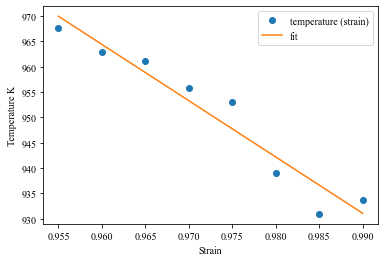

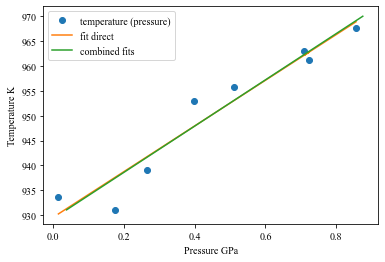

929.5319945795424 929.2745487250498
929.5319945795424 949.3051249933085 940.1322922863508 958.4779577002661
{'timestep': 2, 'fit_range': 0.05, 'nve_run_time_steps': 25000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 929.5319945795424, 'center': 0.99}
The job ham_npt_solid_929_53 was saved and received the ID: 146
The job ham_npt_liquid_high_1929_53 was saved and received the ID: 147
The job ham_npt_liquid_low_929_53 was saved and received the ID: 148


2020-10-22 00:42:05,897 - pyiron_log - WARNING - Job 'ham_nve_0_94_929_53_0' does not exist and cannot be loaded
2020-10-22 00:42:05,897 - pyiron_log - WARNING - Job 'ham_nve_0_94_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_94_929_53_0 was saved and received the ID: 149


2020-10-22 00:42:34,738 - pyiron_log - WARNING - Job 'ham_nve_0_945_929_53_0' does not exist and cannot be loaded
2020-10-22 00:42:34,738 - pyiron_log - WARNING - Job 'ham_nve_0_945_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_945_929_53_0 was saved and received the ID: 150


2020-10-22 00:43:03,040 - pyiron_log - WARNING - Job 'ham_nve_0_95_929_53_0' does not exist and cannot be loaded
2020-10-22 00:43:03,040 - pyiron_log - WARNING - Job 'ham_nve_0_95_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_95_929_53_0 was saved and received the ID: 151


2020-10-22 00:43:31,129 - pyiron_log - WARNING - Job 'ham_nve_0_955_929_53_0' does not exist and cannot be loaded
2020-10-22 00:43:31,129 - pyiron_log - WARNING - Job 'ham_nve_0_955_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_955_929_53_0 was saved and received the ID: 152


2020-10-22 00:43:59,203 - pyiron_log - WARNING - Job 'ham_nve_0_96_929_53_0' does not exist and cannot be loaded
2020-10-22 00:43:59,203 - pyiron_log - WARNING - Job 'ham_nve_0_96_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_96_929_53_0 was saved and received the ID: 153


2020-10-22 00:44:27,147 - pyiron_log - WARNING - Job 'ham_nve_0_965_929_53_0' does not exist and cannot be loaded
2020-10-22 00:44:27,147 - pyiron_log - WARNING - Job 'ham_nve_0_965_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_965_929_53_0 was saved and received the ID: 154


2020-10-22 00:44:55,252 - pyiron_log - WARNING - Job 'ham_nve_0_97_929_53_0' does not exist and cannot be loaded
2020-10-22 00:44:55,252 - pyiron_log - WARNING - Job 'ham_nve_0_97_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_97_929_53_0 was saved and received the ID: 155


2020-10-22 00:45:22,791 - pyiron_log - WARNING - Job 'ham_nve_0_975_929_53_0' does not exist and cannot be loaded
2020-10-22 00:45:22,791 - pyiron_log - WARNING - Job 'ham_nve_0_975_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_975_929_53_0 was saved and received the ID: 156


2020-10-22 00:45:50,198 - pyiron_log - WARNING - Job 'ham_nve_0_98_929_53_0' does not exist and cannot be loaded
2020-10-22 00:45:50,198 - pyiron_log - WARNING - Job 'ham_nve_0_98_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_98_929_53_0 was saved and received the ID: 157


2020-10-22 00:46:17,117 - pyiron_log - WARNING - Job 'ham_nve_0_985_929_53_0' does not exist and cannot be loaded
2020-10-22 00:46:17,117 - pyiron_log - WARNING - Job 'ham_nve_0_985_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_985_929_53_0 was saved and received the ID: 158


2020-10-22 00:46:44,097 - pyiron_log - WARNING - Job 'ham_nve_0_99_929_53_0' does not exist and cannot be loaded
2020-10-22 00:46:44,097 - pyiron_log - WARNING - Job 'ham_nve_0_99_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_99_929_53_0 was saved and received the ID: 159


2020-10-22 00:47:11,183 - pyiron_log - WARNING - Job 'ham_nve_0_995_929_53_0' does not exist and cannot be loaded
2020-10-22 00:47:11,183 - pyiron_log - WARNING - Job 'ham_nve_0_995_929_53_0' does not exist and cannot be loaded


The job ham_nvt_0_995_929_53_0 was saved and received the ID: 160


2020-10-22 00:47:37,775 - pyiron_log - WARNING - Job 'ham_nve_1_0_929_53_0' does not exist and cannot be loaded
2020-10-22 00:47:37,775 - pyiron_log - WARNING - Job 'ham_nve_1_0_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_0_929_53_0 was saved and received the ID: 161


2020-10-22 00:48:03,986 - pyiron_log - WARNING - Job 'ham_nve_1_005_929_53_0' does not exist and cannot be loaded
2020-10-22 00:48:03,986 - pyiron_log - WARNING - Job 'ham_nve_1_005_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_005_929_53_0 was saved and received the ID: 162


2020-10-22 00:48:30,321 - pyiron_log - WARNING - Job 'ham_nve_1_01_929_53_0' does not exist and cannot be loaded
2020-10-22 00:48:30,321 - pyiron_log - WARNING - Job 'ham_nve_1_01_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_01_929_53_0 was saved and received the ID: 163


2020-10-22 00:48:56,867 - pyiron_log - WARNING - Job 'ham_nve_1_015_929_53_0' does not exist and cannot be loaded
2020-10-22 00:48:56,867 - pyiron_log - WARNING - Job 'ham_nve_1_015_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_015_929_53_0 was saved and received the ID: 164


2020-10-22 00:49:23,134 - pyiron_log - WARNING - Job 'ham_nve_1_02_929_53_0' does not exist and cannot be loaded
2020-10-22 00:49:23,134 - pyiron_log - WARNING - Job 'ham_nve_1_02_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_02_929_53_0 was saved and received the ID: 165


2020-10-22 00:49:49,843 - pyiron_log - WARNING - Job 'ham_nve_1_025_929_53_0' does not exist and cannot be loaded
2020-10-22 00:49:49,843 - pyiron_log - WARNING - Job 'ham_nve_1_025_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_025_929_53_0 was saved and received the ID: 166


2020-10-22 00:50:16,859 - pyiron_log - WARNING - Job 'ham_nve_1_03_929_53_0' does not exist and cannot be loaded
2020-10-22 00:50:16,859 - pyiron_log - WARNING - Job 'ham_nve_1_03_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_03_929_53_0 was saved and received the ID: 167


2020-10-22 00:50:43,780 - pyiron_log - WARNING - Job 'ham_nve_1_035_929_53_0' does not exist and cannot be loaded
2020-10-22 00:50:43,780 - pyiron_log - WARNING - Job 'ham_nve_1_035_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_035_929_53_0 was saved and received the ID: 168


2020-10-22 00:51:11,062 - pyiron_log - WARNING - Job 'ham_nve_1_04_929_53_0' does not exist and cannot be loaded
2020-10-22 00:51:11,062 - pyiron_log - WARNING - Job 'ham_nve_1_04_929_53_0' does not exist and cannot be loaded


The job ham_nvt_1_04_929_53_0 was saved and received the ID: 169
The job ham_nve_0_94_929_53_0 was saved and received the ID: 170
The job ham_nve_0_945_929_53_0 was saved and received the ID: 171
The job ham_nve_0_95_929_53_0 was saved and received the ID: 172
The job ham_nve_0_955_929_53_0 was saved and received the ID: 173
The job ham_nve_0_96_929_53_0 was saved and received the ID: 174
The job ham_nve_0_965_929_53_0 was saved and received the ID: 175
The job ham_nve_0_97_929_53_0 was saved and received the ID: 176
The job ham_nve_0_975_929_53_0 was saved and received the ID: 177
The job ham_nve_0_98_929_53_0 was saved and received the ID: 178
The job ham_nve_0_985_929_53_0 was saved and received the ID: 179
The job ham_nve_0_99_929_53_0 was saved and received the ID: 180
The job ham_nve_0_995_929_53_0 was saved and received the ID: 181
The job ham_nve_1_0_929_53_0 was saved and received the ID: 182
The job ham_nve_1_005_929_53_0 was saved and received the ID: 183
The job ham_nve_1_0

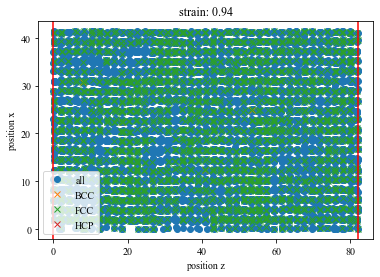

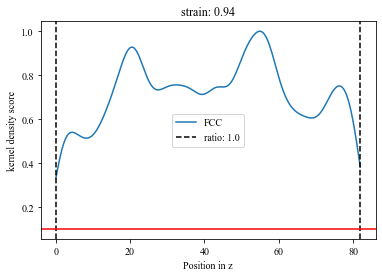

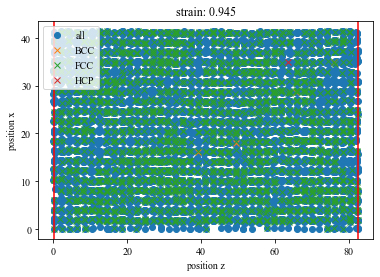

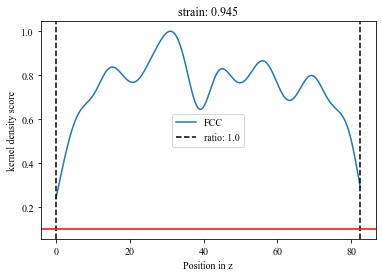

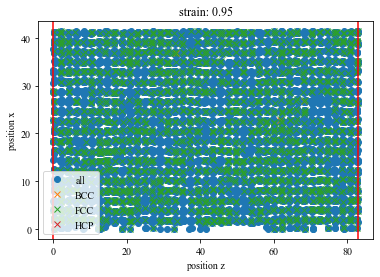

...

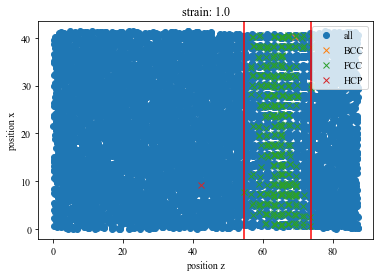

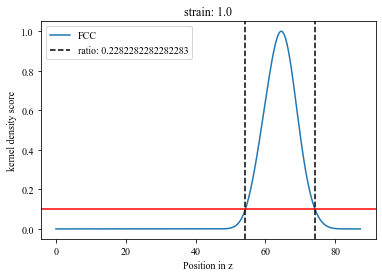

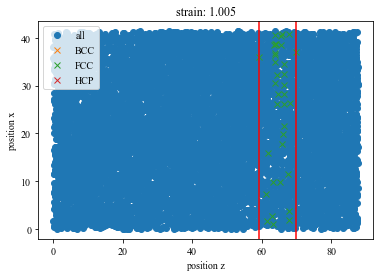

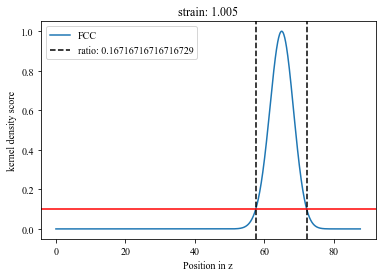

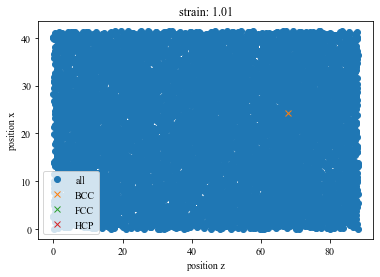

No handles with labels found to put in legend.


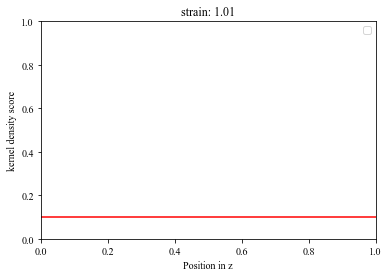

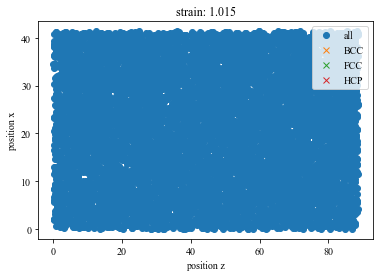

No handles with labels found to put in legend.


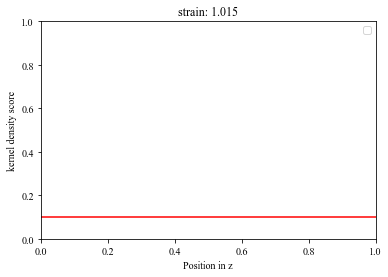

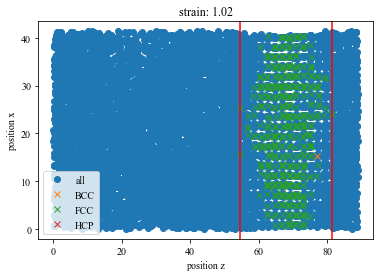

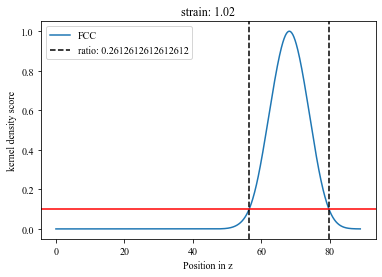

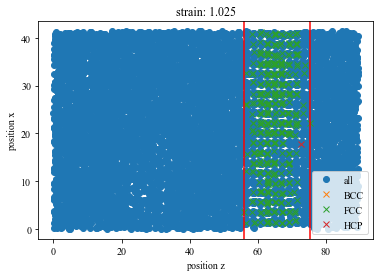

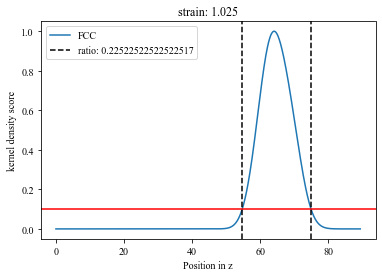

...

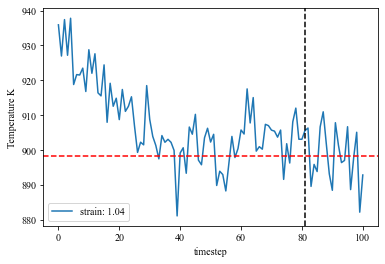

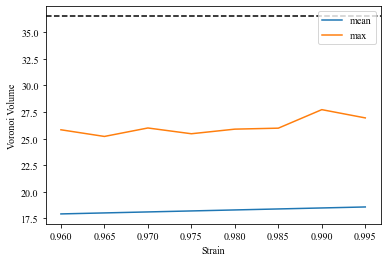

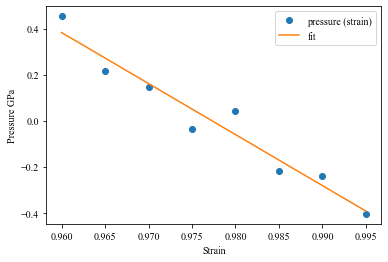

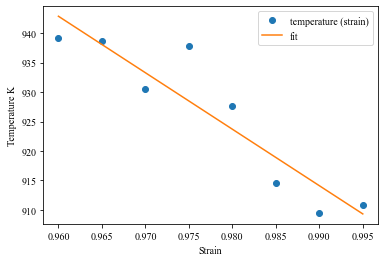

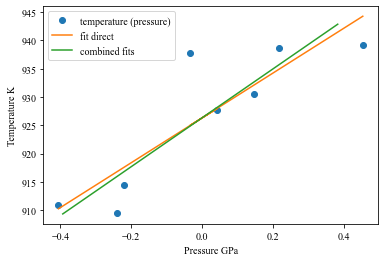

926.3015032537846 926.3198967204412
926.3015032537846 924.3145124079808 916.8836365281269 931.7453882878349
{'timestep': 2, 'fit_range': 0.01, 'nve_run_time_steps': 20000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 926.3015032537846, 'center': 0.98}
The job ham_npt_solid_926_3 was saved and received the ID: 191
The job ham_npt_liquid_high_1926_3 was saved and received the ID: 192
The job ham_npt_liquid_low_926_3 was saved and received the ID: 193


2020-10-22 01:22:11,229 - pyiron_log - WARNING - Job 'ham_nve_0_97_926_3_1' does not exist and cannot be loaded
2020-10-22 01:22:11,229 - pyiron_log - WARNING - Job 'ham_nve_0_97_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_97_926_3_1 was saved and received the ID: 194


2020-10-22 01:22:38,909 - pyiron_log - WARNING - Job 'ham_nve_0_971_926_3_1' does not exist and cannot be loaded
2020-10-22 01:22:38,909 - pyiron_log - WARNING - Job 'ham_nve_0_971_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_971_926_3_1 was saved and received the ID: 195


2020-10-22 01:23:06,837 - pyiron_log - WARNING - Job 'ham_nve_0_972_926_3_1' does not exist and cannot be loaded
2020-10-22 01:23:06,837 - pyiron_log - WARNING - Job 'ham_nve_0_972_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_972_926_3_1 was saved and received the ID: 196


2020-10-22 01:23:34,622 - pyiron_log - WARNING - Job 'ham_nve_0_973_926_3_1' does not exist and cannot be loaded
2020-10-22 01:23:34,622 - pyiron_log - WARNING - Job 'ham_nve_0_973_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_973_926_3_1 was saved and received the ID: 197


2020-10-22 01:24:02,570 - pyiron_log - WARNING - Job 'ham_nve_0_974_926_3_1' does not exist and cannot be loaded
2020-10-22 01:24:02,570 - pyiron_log - WARNING - Job 'ham_nve_0_974_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_974_926_3_1 was saved and received the ID: 198


2020-10-22 01:24:29,824 - pyiron_log - WARNING - Job 'ham_nve_0_975_926_3_1' does not exist and cannot be loaded
2020-10-22 01:24:29,824 - pyiron_log - WARNING - Job 'ham_nve_0_975_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_975_926_3_1 was saved and received the ID: 199


2020-10-22 01:24:57,465 - pyiron_log - WARNING - Job 'ham_nve_0_976_926_3_1' does not exist and cannot be loaded
2020-10-22 01:24:57,465 - pyiron_log - WARNING - Job 'ham_nve_0_976_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_976_926_3_1 was saved and received the ID: 200


2020-10-22 01:25:25,227 - pyiron_log - WARNING - Job 'ham_nve_0_977_926_3_1' does not exist and cannot be loaded
2020-10-22 01:25:25,227 - pyiron_log - WARNING - Job 'ham_nve_0_977_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_977_926_3_1 was saved and received the ID: 201


2020-10-22 01:25:52,309 - pyiron_log - WARNING - Job 'ham_nve_0_978_926_3_1' does not exist and cannot be loaded
2020-10-22 01:25:52,309 - pyiron_log - WARNING - Job 'ham_nve_0_978_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_978_926_3_1 was saved and received the ID: 202


2020-10-22 01:26:20,015 - pyiron_log - WARNING - Job 'ham_nve_0_979_926_3_1' does not exist and cannot be loaded
2020-10-22 01:26:20,015 - pyiron_log - WARNING - Job 'ham_nve_0_979_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_979_926_3_1 was saved and received the ID: 203


2020-10-22 01:26:47,601 - pyiron_log - WARNING - Job 'ham_nve_0_98_926_3_1' does not exist and cannot be loaded
2020-10-22 01:26:47,601 - pyiron_log - WARNING - Job 'ham_nve_0_98_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_98_926_3_1 was saved and received the ID: 204


2020-10-22 01:27:15,287 - pyiron_log - WARNING - Job 'ham_nve_0_981_926_3_1' does not exist and cannot be loaded
2020-10-22 01:27:15,287 - pyiron_log - WARNING - Job 'ham_nve_0_981_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_981_926_3_1 was saved and received the ID: 205


2020-10-22 01:27:42,561 - pyiron_log - WARNING - Job 'ham_nve_0_982_926_3_1' does not exist and cannot be loaded
2020-10-22 01:27:42,561 - pyiron_log - WARNING - Job 'ham_nve_0_982_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_982_926_3_1 was saved and received the ID: 206


2020-10-22 01:28:10,152 - pyiron_log - WARNING - Job 'ham_nve_0_983_926_3_1' does not exist and cannot be loaded
2020-10-22 01:28:10,152 - pyiron_log - WARNING - Job 'ham_nve_0_983_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_983_926_3_1 was saved and received the ID: 207


2020-10-22 01:28:37,140 - pyiron_log - WARNING - Job 'ham_nve_0_984_926_3_1' does not exist and cannot be loaded
2020-10-22 01:28:37,140 - pyiron_log - WARNING - Job 'ham_nve_0_984_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_984_926_3_1 was saved and received the ID: 208


2020-10-22 01:29:03,977 - pyiron_log - WARNING - Job 'ham_nve_0_985_926_3_1' does not exist and cannot be loaded
2020-10-22 01:29:03,977 - pyiron_log - WARNING - Job 'ham_nve_0_985_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_985_926_3_1 was saved and received the ID: 209


2020-10-22 01:29:31,304 - pyiron_log - WARNING - Job 'ham_nve_0_986_926_3_1' does not exist and cannot be loaded
2020-10-22 01:29:31,304 - pyiron_log - WARNING - Job 'ham_nve_0_986_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_986_926_3_1 was saved and received the ID: 210


2020-10-22 01:29:58,652 - pyiron_log - WARNING - Job 'ham_nve_0_987_926_3_1' does not exist and cannot be loaded
2020-10-22 01:29:58,652 - pyiron_log - WARNING - Job 'ham_nve_0_987_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_987_926_3_1 was saved and received the ID: 211


2020-10-22 01:30:25,659 - pyiron_log - WARNING - Job 'ham_nve_0_988_926_3_1' does not exist and cannot be loaded
2020-10-22 01:30:25,659 - pyiron_log - WARNING - Job 'ham_nve_0_988_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_988_926_3_1 was saved and received the ID: 212


2020-10-22 01:30:52,554 - pyiron_log - WARNING - Job 'ham_nve_0_989_926_3_1' does not exist and cannot be loaded
2020-10-22 01:30:52,554 - pyiron_log - WARNING - Job 'ham_nve_0_989_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_989_926_3_1 was saved and received the ID: 213


2020-10-22 01:31:19,587 - pyiron_log - WARNING - Job 'ham_nve_0_99_926_3_1' does not exist and cannot be loaded
2020-10-22 01:31:19,587 - pyiron_log - WARNING - Job 'ham_nve_0_99_926_3_1' does not exist and cannot be loaded


The job ham_nvt_0_99_926_3_1 was saved and received the ID: 214
The job ham_nve_0_97_926_3_1 was saved and received the ID: 215
The job ham_nve_0_971_926_3_1 was saved and received the ID: 216
The job ham_nve_0_972_926_3_1 was saved and received the ID: 217
The job ham_nve_0_973_926_3_1 was saved and received the ID: 218
The job ham_nve_0_974_926_3_1 was saved and received the ID: 219
The job ham_nve_0_975_926_3_1 was saved and received the ID: 220
The job ham_nve_0_976_926_3_1 was saved and received the ID: 221
The job ham_nve_0_977_926_3_1 was saved and received the ID: 222
The job ham_nve_0_978_926_3_1 was saved and received the ID: 223
The job ham_nve_0_979_926_3_1 was saved and received the ID: 224
The job ham_nve_0_98_926_3_1 was saved and received the ID: 225
The job ham_nve_0_981_926_3_1 was saved and received the ID: 226
The job ham_nve_0_982_926_3_1 was saved and received the ID: 227
The job ham_nve_0_983_926_3_1 was saved and received the ID: 228
The job ham_nve_0_984_926_3_

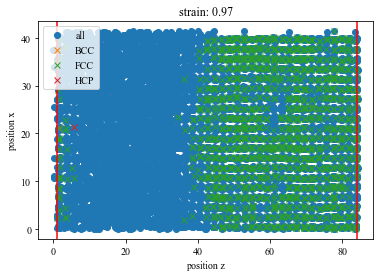

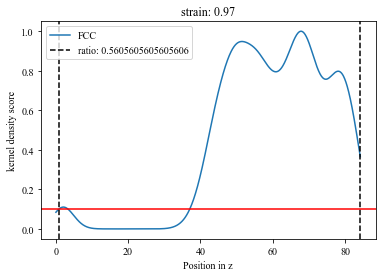

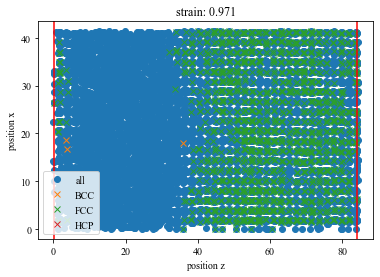

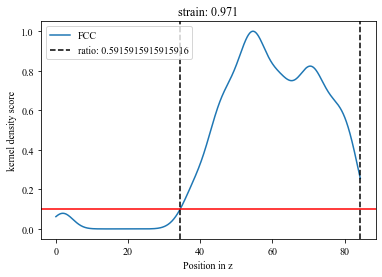

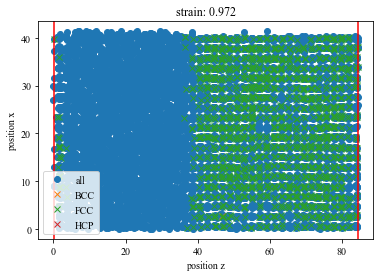

...

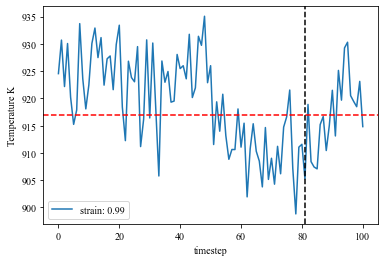

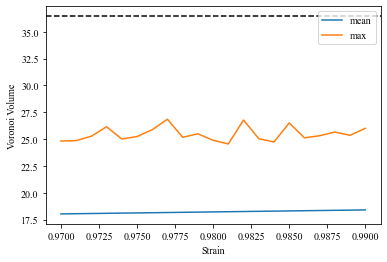

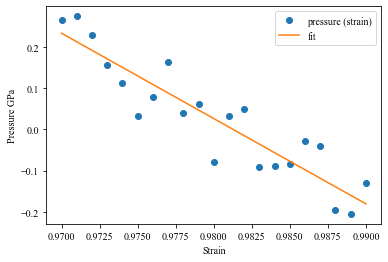

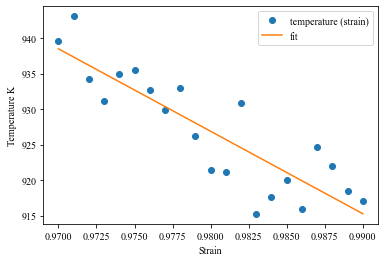

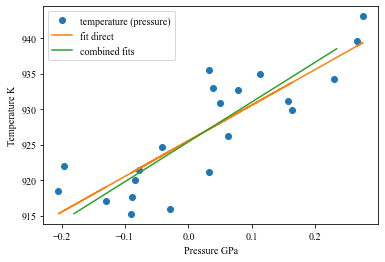

925.5475828958861 925.3906331109473
925.5475828958861 929.159198964262 922.1994786359271 936.1189192925968
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 925.5475828958861, 'center': 0.98}


In [42]:
temperature_estimate_lst, temperature_calculated_lst = [], []
while len(temperature_calculated_lst) < 3 or not convergence_goal_achieved and len(temperature_calculated_lst) < 10:
    temperature_estimate_lst.append(temperature_next)
    temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep=timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=center,
        debug_plot=True)
    print(temperature_next, temperature_mean, temperature_left, temperature_right)
    output = validate_convergence(pr=pr,
                                  temperature_left=temperature_left, 
                                  temperature_next=temperature_next, 
                                  temperature_right=temperature_right, 
                                  enable_iteration=enable_iteration,
                                  timestep_iter=timestep_iter,
                                  timestep_lst=project_parameter['timestep_lst'],
                                  timestep=timestep,
                                  fit_range_iter=fit_range_iter, 
                                  fit_range_lst=project_parameter['fit_range_lst'], 
                                  fit_range=fit_range, 
                                  nve_run_time_steps_iter=nve_run_time_steps_iter, 
                                  nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'], 
                                  nve_run_time_steps=nve_run_time_steps,
                                  strain_result_lst=strain_result_lst, 
                                  pressure_result_lst=pressure_result_lst, 
                                  step_count=step_count, 
                                  step_dict=step_dict, 
                                  boundary_value=project_parameter['boundary_value'], 
                                  ratio_boundary=project_parameter['ratio_boundary'],
                                  convergence_goal=project_parameter['convergence_criterion'],
                                  output_file=output_file)
    convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output
    print(step_dict[step_count])
    temperature_calculated_lst.append(temperature_next)

In [43]:
if not os.path.exists(output_file):
    with open(output_file, 'w') as f:
        json.dump(step_dict, f)

In [44]:
step_dict

{0: {'temperature_next': 836},
 1: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 908.908942174603,
  'center': 0.9},
 2: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 954.3555,
  'center': 1.0},
 3: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 929.5319945795424,
  'center': 0.99},
 4: {'timestep': 2,
  'fit_range': 0.01,
  'nve_run_time_steps': 20000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 926.3015032537846,
  'center': 0.98},
 5: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 925.5475828958861,
  'center': 0.98}}

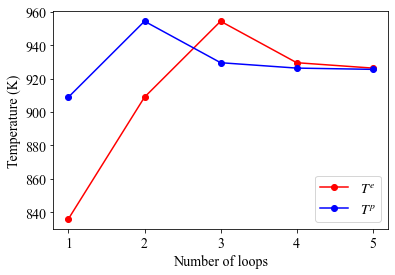

In [45]:
#plot the convergence of loop calculations
first_key = list(step_dict.keys())[-1]
second_key = 'temperature_next'
allt = [step_dict[key][second_key] for key in list(step_dict.keys())]
plt.plot(np.arange(1, len(allt)), allt[0:-1], 'ro-', label=r"$T^e$")
plt.plot(np.arange(1, len(allt)), allt[1:], 'bo-', label=r"$T^p$")
plt.legend(fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.xlabel('Number of loops', fontsize=14)
plt.ylabel('Temperature (K)', fontsize=14)
plt.show()

In [46]:
df = pr.job_table()
df

,id,status,chemicalformula,job,subjob,projectpath,project,timestart,timestop,totalcputime,computer,hamilton,hamversion,parentid,masterid
0,1,finished,Al4000,minimize_pos,/minimize_pos,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:16:31.899202,2020-10-21 18:16:32.355506,0.0,janj@cmti001#1,Lammps,0.1,NaN,None
1,2,finished,Al4000,minimize_vol,/minimize_vol,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:16:33.135528,2020-10-21 18:16:33.587072,0.0,janj@cmti001#1,Lammps,0.1,NaN,None
2,3,finished,Al4000,temp_heating_1000,/temp_heating_1000,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:28:53.516347,2020-10-21 18:28:55.581259,2.0,janj@cmti001#8,Lammps,0.1,NaN,None
3,4,finished,Al4000,temp_heating_500_0,/temp_heating_500_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:28:57.004099,2020-10-21 18:28:59.050755,2.0,janj@cmti001#8,Lammps,0.1,NaN,None
4,5,finished,Al4000,temp_heating_750_0,/temp_heating_750_0,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-21 18:29:00.484433,2020-10-21 18:29:02.457136,1.0,janj@cmti001#8,Lammps,0.1,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,231,finished,Al8000,ham_nve_0_986_926_3_1,/ham_nve_0_986_926_3_1,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-22 01:46:06.978259,2020-10-22 01:46:58.188159,51.0,janj@cmti001#8,Lammps,0.1,210.0,None
231,232,finished,Al8000,ham_nve_0_987_926_3_1,/ham_nve_0_987_926_3_1,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-22 01:46:59.705680,2020-10-22 01:50:57.139570,237.0,janj@cmti001#8,Lammps,0.1,211.0,None
232,233,finished,Al8000,ham_nve_0_988_926_3_1,/ham_nve_0_988_926_3_1,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-22 01:50:58.628432,2020-10-22 01:51:49.501023,50.0,janj@cmti001#8,Lammps,0.1,212.0,None
233,234,finished,Al8000,ham_nve_0_989_926_3_1,/ham_nve_0_989_926_3_1,/cmmc/u/,janj/pyiron/projects/2020/2020-10-21-melting-pyscal/melting/,2020-10-22 01:51:50.989293,2020-10-22 01:52:42.163865,51.0,janj@cmti001#8,Lammps,0.1,213.0,None
